# Aprendizaje Automático - Trabajo Práctico
## Profesores
* Joel Spak
* Augstín Almada
* Bruno Cocitto López
## Alumnos
* Ezequiel Arévalo
* Simón Revello

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
import warnings

In [6]:
warnings.simplefilter(action='ignore', category=FutureWarning)

In [7]:
DATA_FILE = "weatherAUS.csv"
data = pd.read_csv(DATA_FILE)

## Análisis Descriptivo

Nos quedamos con las localidades que corresponden para el trabajo práctico e imprimimos los campos del dataset para entenderlo mejor.

In [8]:
data.query("Location in ('Sydney', 'SydneyAirport', 'Canberra', 'Melbourne', 'MelbourneAirport')", inplace=True)
data.drop("Unnamed: 0", axis=1, inplace=True)

In [9]:
print(data.info())
print("-----------------------------------")
print(data.describe())
print("-----------------------------------")
print(data.head())

<class 'pandas.core.frame.DataFrame'>
Index: 15986 entries, 30167 to 70370
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              15986 non-null  object 
 1   Location          15986 non-null  object 
 2   MinTemp           15495 non-null  float64
 3   MaxTemp           15500 non-null  float64
 4   Rainfall          15199 non-null  float64
 5   Evaporation       14280 non-null  float64
 6   Sunshine          14038 non-null  float64
 7   WindGustDir       14529 non-null  object 
 8   WindGustSpeed     14531 non-null  float64
 9   WindDir9am        15291 non-null  object 
 10  WindDir3pm        15696 non-null  object 
 11  WindSpeed9am      15725 non-null  float64
 12  WindSpeed3pm      15737 non-null  float64
 13  Humidity9am       15416 non-null  float64
 14  Humidity3pm       15461 non-null  float64
 15  Pressure9am       15251 non-null  float64
 16  Pressure3pm       15260 non-null  float64

## Valores Nulos
Graficamos la dispersion de los valores nulos en un mapa de calor

<Axes: >

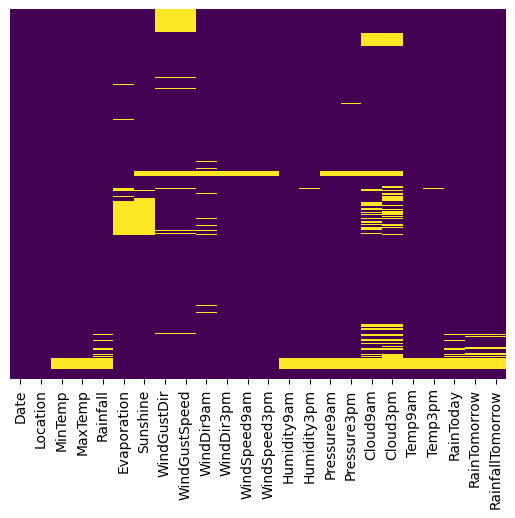

In [10]:
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False)

# Tratamiento de los valores nulos
---
## RainTomorrow, RainToday y RainfallTomorrow

<p> Removeremos las filas que contengan valores nulos para RainToday, RainTomorrow y RainfallTomorrow y la almacenaremos en una variable para utilizarla para predecir sus valores como practica un vez que se tenga el modelo armado con la regresion lineal. </p>

In [11]:
null_rows_for_predictions = data.loc[ data['RainTomorrow'].isnull() | data['RainfallTomorrow'].isnull() | data['Rainfall'].isnull()  ]
data = data [ data['RainTomorrow'].notna() & data["RainfallTomorrow"].notna() & data["RainToday"].notna() ]

## Generar encodings para variable categoricas no numericas
### Encoding de la variable Date
<p> Se intentaron realizar 3 versiones de encoding para la variable date, por semanas, por meses y por estacion </p>
<p> Luego de probar concluimos que el modelo arrojaba valores muy simalares para las 3 formas de codificar la fecha.</p>
<p> Euristicamente concluimos que no hay un impacto significativo en elegir una de las 3 pero se elige la agrupacion por estacion porque al ser solo 4 variables ayuda a explicar el modelo.</p>
<p> Se deja comentado el codigo del encoding para semanas y meses, pero no se utiliza para un mejor entendimiento de los graficos </p>


In [12]:
from datetime import datetime

#data["Week"] = data["Date"].apply(lambda time: datetime.strptime(time, '%Y-%m-%d').date().isocalendar().week )
#data["Month"] = data["Date"].apply(lambda time: datetime.strptime(time, '%Y-%m-%d').month)
data["Season"] = data["Date"].apply(lambda time: ( datetime.strptime(time, '%Y-%m-%d').month ) %12 // 3 + 1 )

data.drop("Date", axis=1, inplace=True)

### Generar enconding para el resto de las variables

Para variables Yes/No como RainToday and RainTomorrow generamos encoding binarios asignando 1 y 0 respectivamente.
<p> Para variables que describen las direcciones del viento, las colapsamos en 4 valores N,S,W y E. Luego la transformamos a variables dummies al igual que Location. </p>

In [13]:
from sklearn.preprocessing import LabelEncoder

one_hot_encoding=pd.get_dummies(data.Location, dtype=int)
data.drop("Location", axis=1, inplace=True)
data = data.join(one_hot_encoding)

cardinal_points_map = {
    "N" : "^N.*$",
    "S" : "^S.*$",
    "W" : "^W.*$",
    "E" : "^E.*$"
}

for k,v in cardinal_points_map.items():
    data.WindGustDir.replace( to_replace=v, value=k, regex=True, inplace=True)
    data.WindDir3pm.replace( to_replace=v, value=k, regex=True, inplace=True)
    data.WindDir9am.replace( to_replace=v, value=k, regex=True, inplace=True)

one_hot_encoding=pd.get_dummies(data.WindGustDir, dtype=int, prefix="WindGustDir_")
data.drop("WindGustDir", axis=1, inplace=True)
data= data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.WindDir9am, dtype=int,  prefix="WindDir9am_")
data.drop("WindDir9am", axis=1, inplace=True)
data = data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.WindDir3pm, dtype=int,  prefix="WindDir3pm_")
data.drop("WindDir3pm", axis=1, inplace=True)
data = data.join(one_hot_encoding)

# one_hot_encoding=pd.get_dummies(data.Month, dtype=int, prefix="Month_")
# data.drop("Month", axis=1, inplace=True)
# data= data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.Season, dtype=int, prefix="Season_")
data.drop("Season", axis=1, inplace=True)
data= data.join(one_hot_encoding)

# one_hot_encoding=pd.get_dummies(data.Week, dtype=int, prefix="Week_")
# data.drop("Week", axis=1, inplace=True)
# data= data.join(one_hot_encoding)

le = LabelEncoder()
data["RainToday"] = le.fit_transform(data.RainToday)
data["RainTomorrow"] = le.fit_transform(data.RainTomorrow)

full_data_encoded = data.copy() # esta variable se utilizara mas adelante para calcular una regresion sobre los datos sin interpolar

## Graficar y entendier la distribucion de las variables

Primero, trataremos de entender la distribucion del resto de las variables y cómo se ajustan los distintos métodos de interpolación a los datos.

### Interpolar utilizando method='linear'

Considerando que los datos están organizados de manera cronológica y representan valores recolectados cronologicamente para fechas consecutivas, estas no deberian variar demasiado, asi que aplicamos la función de interpolación utilizando el parámetro 'linear' para completar los valores faltantes con datos similares.

A continuación, se muestran como se reemplazan los valores nulos en el conjunto de datos, demostrando que la interpolación 'linear' es más efectiva que, por ejemplo, el uso del 'promedio' para rellenar valores nulos en todas las variables a excepción de Cloud9am, Cloud3pm, Evaporation y Sunshine.

In [14]:
def plot_interpolated_scatter(cols: list, pd_data: pd.DataFrame, method: str, order:any = None, sx :int = None, sy:int = None, fsize : tuple=(12,12)):

    sx = int(len(cols)/2) + int(len(cols)%2) if not sx else sx 
    sy = 2 if not sy else sy 

    f, axs = plt.subplots(sx,sy, figsize=fsize, squeeze=False)
    
    i = 0
    for x in range(0, sx):
        for y in range(0,sy):
            if i > len(cols)-1:
                break
            col = cols[i]
            data_to_plot = pd_data[[col]].copy()
            data_to_plot.loc[:, "is_nan"] = data_to_plot[col].isnull()
            data_to_plot.interpolate(method=method,order=order, inplace=True)
            sbn.scatterplot(data=data_to_plot, x=range(0, data_to_plot.shape[0] ), y=col, hue="is_nan", ax=axs[x][y])
            i+=1
    plt.show()    

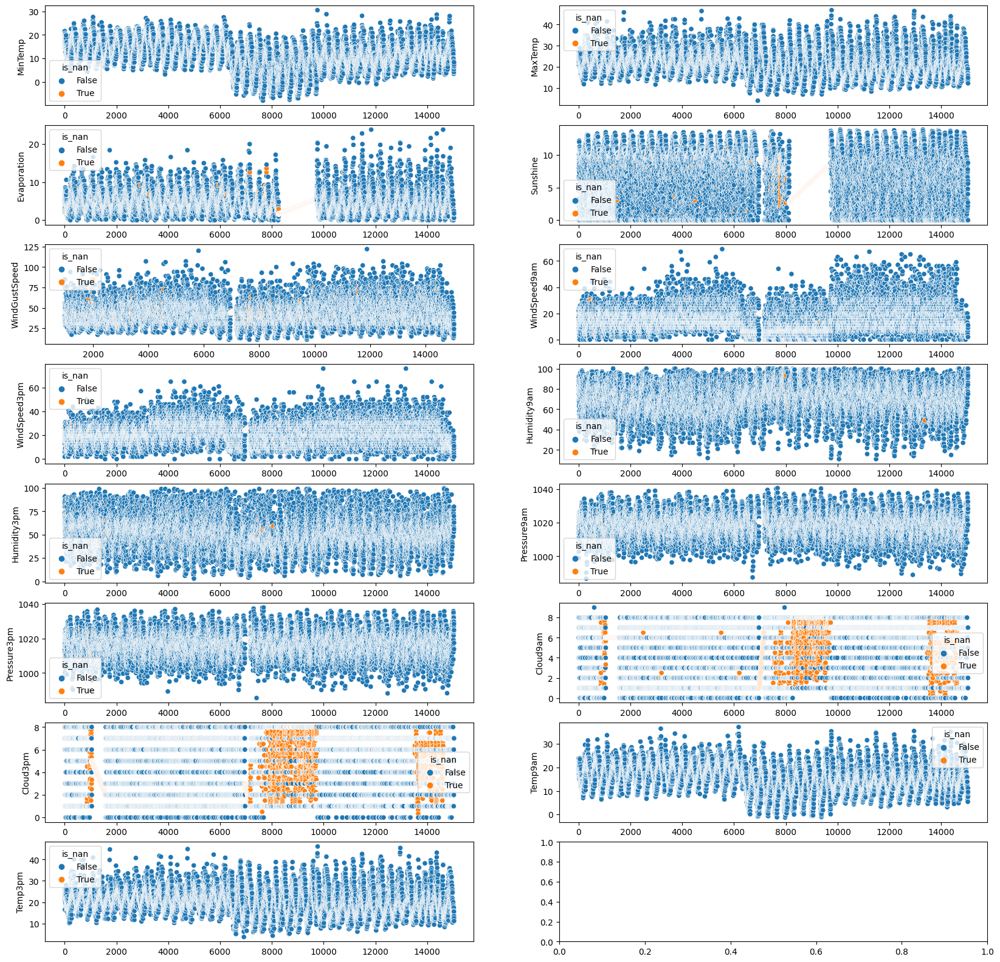

In [15]:
cols = ['MinTemp','MaxTemp','Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm' ]

plot_interpolated_scatter(cols, data, "linear", fsize=(20,20))

### Interpolar utilizando method='nearest'
<p> Al intentar interpolar el resto de las variables utilizando nearest vemos que el resultado no es bueno para Evaporation y Sunshine por la gran cantidad de datos consecutivos faltantes en ambas. </p>
<p> Se nota una mejora en el caso de Cloud9am y Cloud3pm el cual puede ser considerado posteriormente si no se encuentra una forma mas optima de interpolar los valores nulos de estas variables.</p>

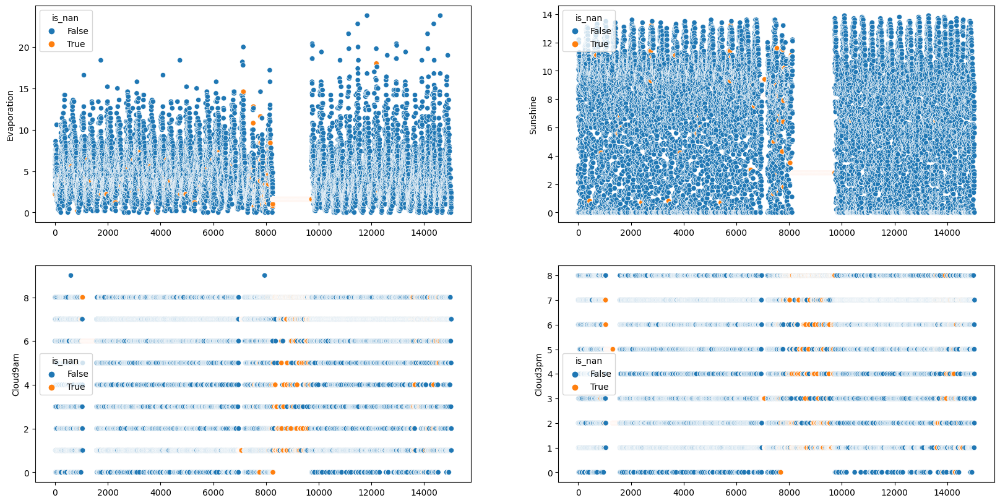

In [16]:
cols = [
    'Evaporation', 'Sunshine',
    'Cloud9am', 'Cloud3pm',
]

plot_interpolated_scatter(cols, data, "nearest", fsize=(20,10))

### Interpolar utilizando method='cubicspline'
Intentamos a continuación inteporlar utilizando distintos métodos polinómicos para intentar conseguir un mejor ajuste para la interpolacion, pero para grandes brechas entre datos los modelos polinómicos no se ajustan bien. 
<p> Por lo que interpolacion mediante metodos polinomicos es la peor opción de todas las analizadas hasta ahora, incluso intentando métodos de órden de diferente exponentes.</p>

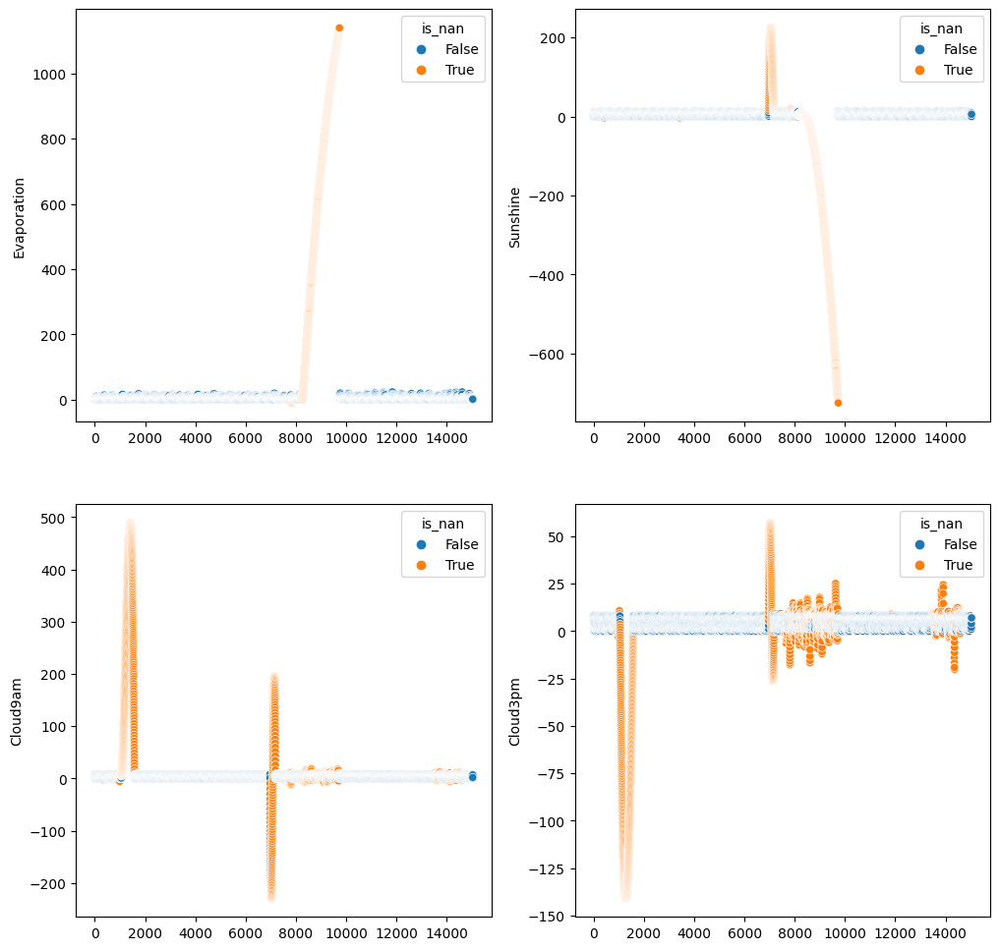

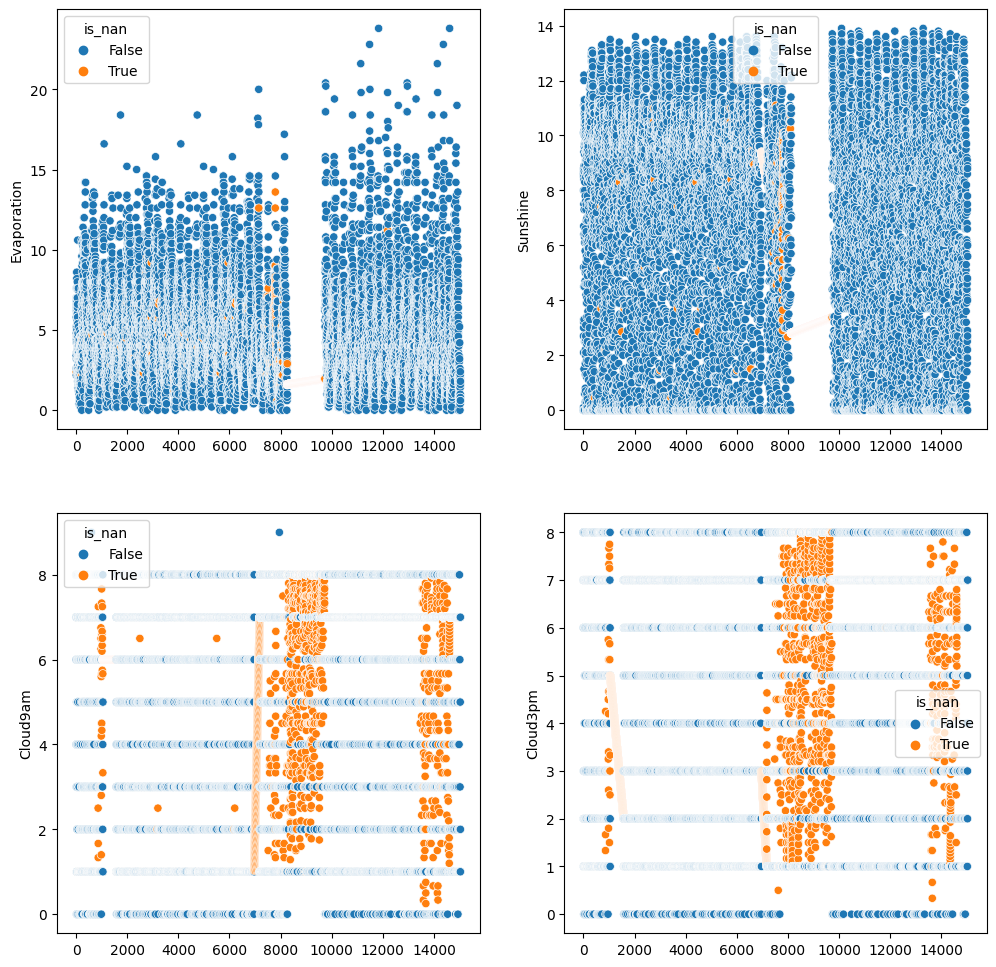

In [17]:
cols = [
    'Evaporation', 'Sunshine',
    'Cloud9am', 'Cloud3pm',
]
plot_interpolated_scatter(cols, data, method="cubicspline")
plot_interpolated_scatter(cols, data, method="polynomial", order=1)

### Conclusión de interpolaciones
Utilizaremos una interpolación lineal para las variables 'MinTemp','MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am' y 'Temp3pm'.

Borraremos las filas nulas para las variables 'Cloud9am' y 'Cloud3pm'.
       
Para Evaporation y Sunshine intentaremos posteriormente encontrar variables explicativas para estas para generar un modelo, e intentar predecir los valores nulos faltantes de la forma mas cercana posible.

In [18]:
linear_cols = ['MinTemp','MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
nearest_cols = ['Cloud9am', 'Cloud3pm']

for col in linear_cols:
    data[col].interpolate(method="linear", inplace=True)
    print( f"{col} valores nulos : {data[col].isnull().sum()}")

for col in nearest_cols:
    data[col].interpolate(method="nearest", inplace=True)
    print( f"{col} valores nulos : {data[col].isnull().sum()}")


MinTemp valores nulos : 0
MaxTemp valores nulos : 0
WindSpeed9am valores nulos : 0
WindSpeed3pm valores nulos : 0
Humidity9am valores nulos : 0
Humidity3pm valores nulos : 0
Pressure9am valores nulos : 0
Pressure3pm valores nulos : 0
Temp9am valores nulos : 0
Temp3pm valores nulos : 0
Cloud9am valores nulos : 0
Cloud3pm valores nulos : 0


### Nota
Vemos que la interpolacion lineal no se completa exitosamente para "WindGustSpeed". Esto se debe a que la ultima row para esta columna está vacia, por lo que no puede crearse una relación entre el último dato registrado y la última row de esta columna.
<p>Graficamos nuevamente un heatmap para entender cómo quedó la distribución de valores nulos en el dataset después de la interpolación</p>

<Axes: >

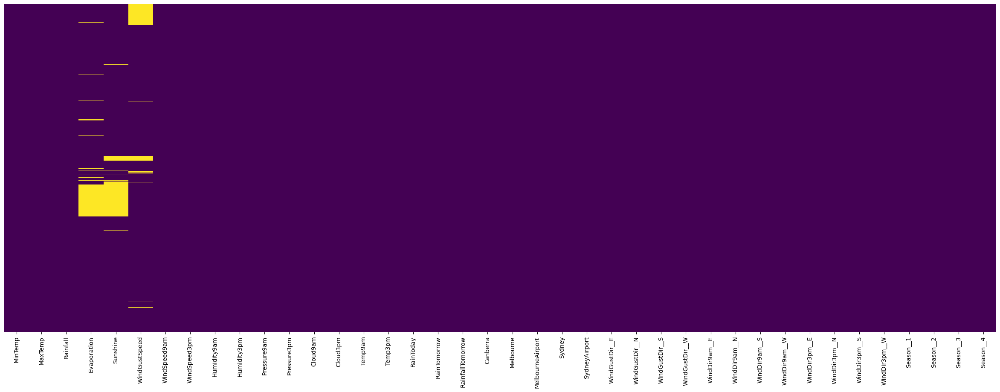

In [19]:
fig, ax = plt.subplots(figsize=(30, 10))
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False,)

Normalizaremos los datos y crearemos una matriz de correlación para tratar de entender la importancia y el peso de las mismas.
Se puede asumir que todavia las variables que tienen valores nulos son variables explicativas importantes para el modelo.

Sunshine ( luminocidad ): probablemente muy relacionado a la evaporación, la temperatura, la nubosidad y la presión.
Evaporation ( Evaporacion): se asume que tiene las mismas relaciones fuertes al igual sunshine.
WindGustSpeed( Rafagas de viento ): Probablemente muy relacionada a la presión.

Graficaremos una matriz de correlación para ver si se puede crear un modelo de regresión para predecir la mayor cantidad de valores para estas variables.

## Normalizar variables numéricas
Normalizamos las variables numéricas ya que se encuentran todas en diferentes escalas

In [20]:
from sklearn.preprocessing import StandardScaler

categorical_vars = [ 'RainTomorrow', 'RainToday','Canberra', 'Melbourne', 'MelbourneAirport',
       'Sydney', 'SydneyAirport', 'WindGustDir__E', 'WindGustDir__N',
       'WindGustDir__S', 'WindGustDir__W', 'WindDir3pm__E', 'WindDir3pm__N',
       'WindDir3pm__S', 'WindDir3pm__W', 'WindDir9am__E', 'WindDir9am__N', 'WindDir9am__S', 'WindDir9am__W',
       'Month__1', 'Month__2', 'Month__3',
       'Month__4', 'Month__5', 'Month__6', 'Month__7', 'Month__8', 'Month__9',
       'Month__10', 'Month__11', 'Month__12', 'Season__1', 'Season__2',
       'Season__3', 'Season__4'
]

numerical_vars = [ col for col in data.columns if col not in categorical_vars ]

scale= StandardScaler() 
scaled_data = data.copy()

scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

## Matriz de correlación

<Axes: >

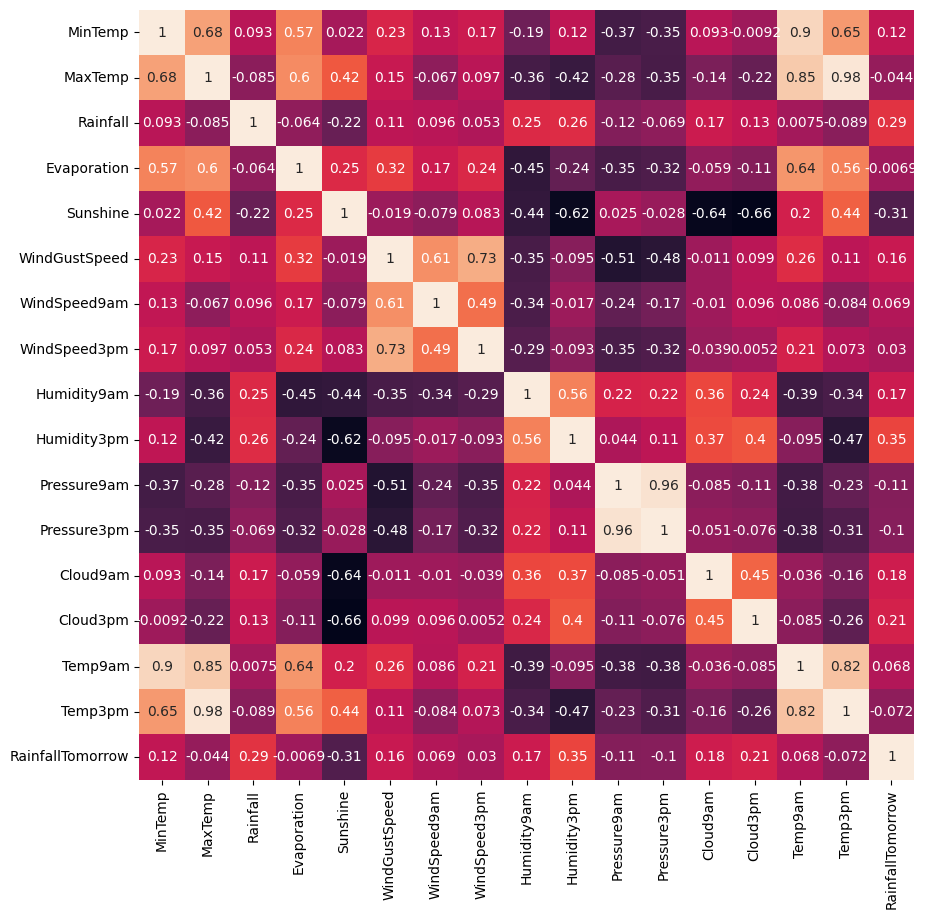

In [21]:
heatmap_data = scaled_data[numerical_vars]

plt.figure(figsize=(10, 10))
sbn.heatmap(heatmap_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

Concluimos que se cumple nuestra predicción anterior acerca de la correlaciones que se encuentran entre las distintas variables.
<p>Por ejemplo que Sunshine tiene una buena correlación con los dias nublados, la humedad y la temperatura.</p>
<p>Se intentera calcular los valores nulos para WindGustSpeed utilizando un modelo de regresion.</p>

<Axes: >

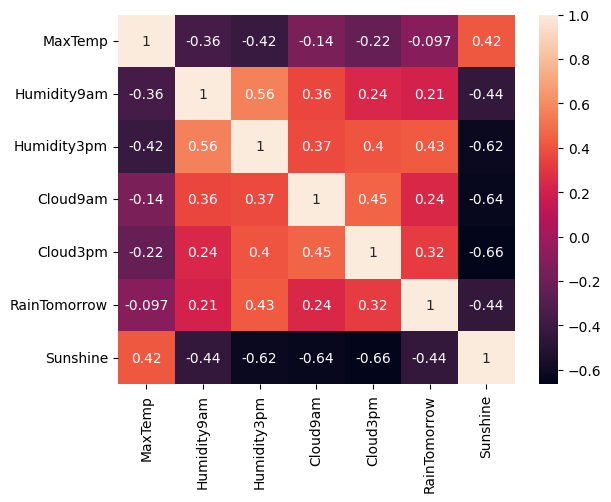

In [22]:
x_train_cols = ["MaxTemp", "Humidity9am", "Humidity3pm", "Cloud9am", "Cloud3pm","RainTomorrow"]

sunshine_data = data[ x_train_cols + ["Sunshine"] ] 
plt.figure()
sbn.heatmap(sunshine_data.corr(numeric_only=True, method='pearson'), yticklabels=True, annot=True)


Vemos que la correlación entre las variables y Sunshine siguen siendo buenas. Por lo que intentaremos predecir los valores nulos utilizando una regresión lineal.

0.6893622266184231 4.612267478840044
-0.7699290851978089 25.11487789424288


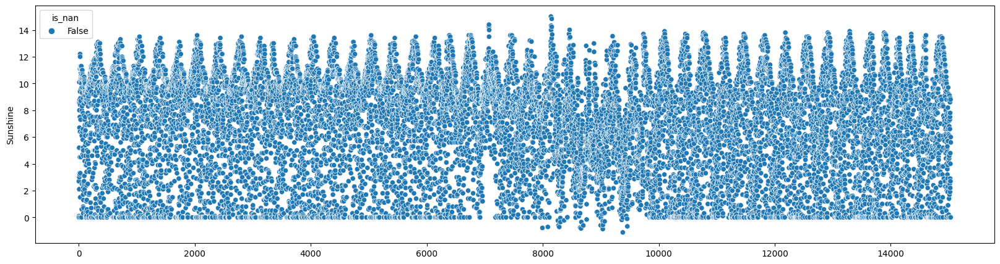

In [23]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import confusion_matrix, classification_report

sunshine_data_null =  sunshine_data[sunshine_data["Sunshine"].isnull()]
sunshine_data_not_null = sunshine_data[sunshine_data["Sunshine"].notnull()] 

x_pred = sunshine_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(sunshine_data_not_null[x_train_cols], sunshine_data_not_null["Sunshine"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Sunshine"] = y_pred
data["Sunshine"].update(x_pred["Sunshine"])

plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5), sy=1)

### Interpolar Sunshine con regresion lineal
Como podemos ver ahora se ajustan mucho mejor los valores para esta variable. Ahora acotaremos los valores entre 0 y 12 para mejorar los datos.

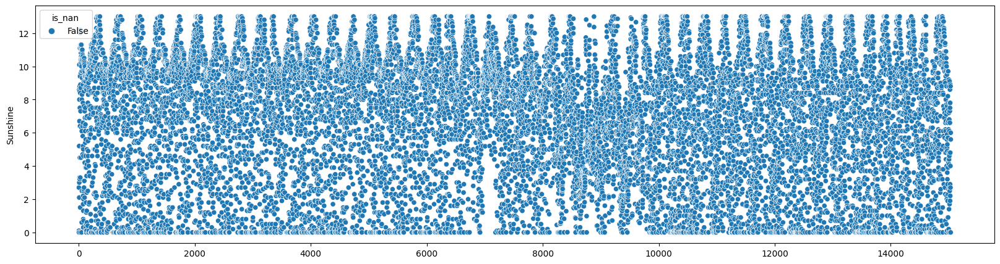

In [24]:
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value >0 else 0 )
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value <=13 else 13 )
plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5),sy=1)

### Regresión e Interpolar Evaporation
Realizamos la creacion de un modelo de regresion lineal para predecir los valores null de Evaporation

0.619148785474096 3.640477627468329
-0.9562984798029637 17.30562842431981


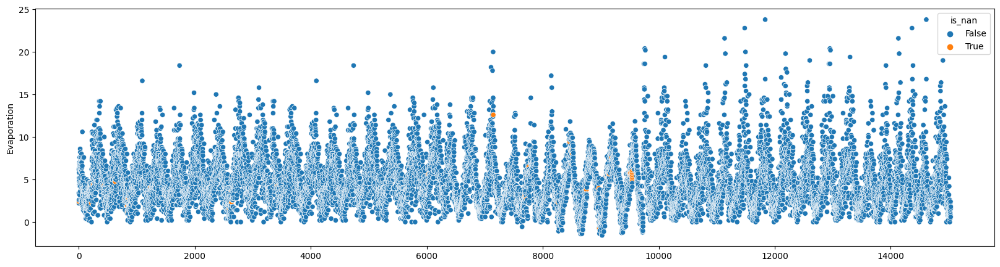

In [25]:
x_train_cols = [ c for c in data.columns if c != "Evaporation" ]

evaporation_data = data[ x_train_cols + ["Evaporation"] ] 
evaporation_data = evaporation_data[ 
    evaporation_data["WindGustSpeed"].notnull()
]

evaporation_data_null =  evaporation_data[evaporation_data["Evaporation"].isnull()]
evaporation_data_not_null = evaporation_data[evaporation_data["Evaporation"].notnull()] 

x_pred =evaporation_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(evaporation_data_not_null[x_train_cols], evaporation_data_not_null["Evaporation"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Evaporation"] = y_pred
data["Evaporation"].update(x_pred["Evaporation"])
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5), sy=1)

### Interpolamos Evaporation
<p> Se probaron varias formas de generar un modelo que se ajuste lo mejor posible para predecir los valores faltantes para la evaporación.</p>
<p> Se concluye heurísticamente que la mejor aproximacion parece ser utilizando el dataset completo. </p>
<p> Quedan algunos valores nulos que no pudieron ser interpolados y agregados al dataset pero vemos que se ajustan bien aplicando una interpolación lineal con el resto de los datos.</p>
<p> Vemos en el grafico que los datos se interpolan de forma mas prolija que todas las estimaciones anteriores usando lo metodos de interpolacion estandar provisto por la libreia Pandas. </p>
<p> Para los valores menores a 0 se restarán la distancia del minimo valor, para moverlos sobre 0 y simular un comportamiento mas parecido a la realidad </p>

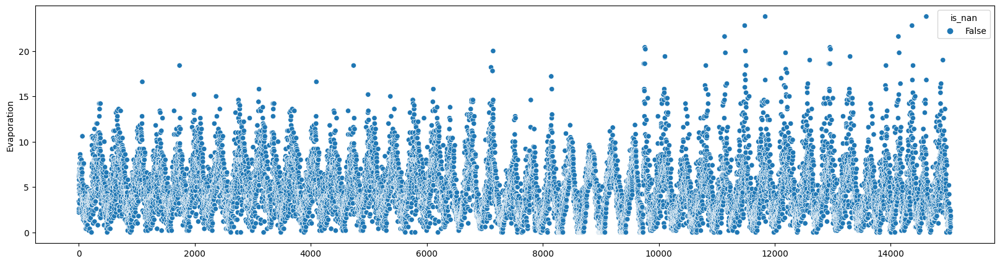

In [26]:
data["Evaporation"].interpolate(method="linear", inplace=True)
data["Evaporation"] = data["Evaporation"].apply(lambda value: 0 if value < 0 else value  )
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5),sy=1)

# Interpolar WindGust
Se replica exactamente el mismo procedimiento que para la estimación de Evaporation y Sunshine.

0.7211598177897154 59.30795965118223
-0.8131980681771049 398.84639155352977


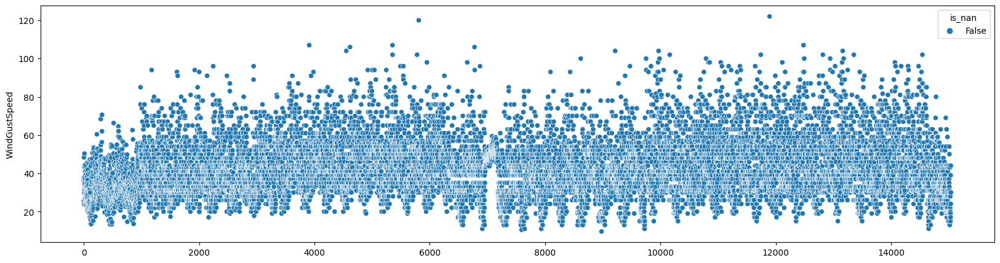

In [27]:
x_train_cols = [ c for c in data.columns if c != "WindGustSpeed" ]

windgust_data = data.copy()

windgust_data_null =  windgust_data[windgust_data["WindGustSpeed"].isnull()]
windgust_data_not_null = windgust_data[windgust_data["WindGustSpeed"].notnull()] 

x_pred = windgust_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(windgust_data_not_null[x_train_cols], windgust_data_not_null["WindGustSpeed"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["WindGustSpeed"] = y_pred
data["WindGustSpeed"].update(x_pred["WindGustSpeed"])
plot_interpolated_scatter(["WindGustSpeed"], data, method="polynomial",fsize=(20,5), sy=1, order=1)

# Escalar nuevamente los datos del dataset para toda las variables numéricas
Volvemos a escalar con nuestros datos nulos ya completos.

In [28]:
scaled_data = data.copy()
scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

### Graficar la matriz de correlación final escalada sin valores nulos

<Axes: >

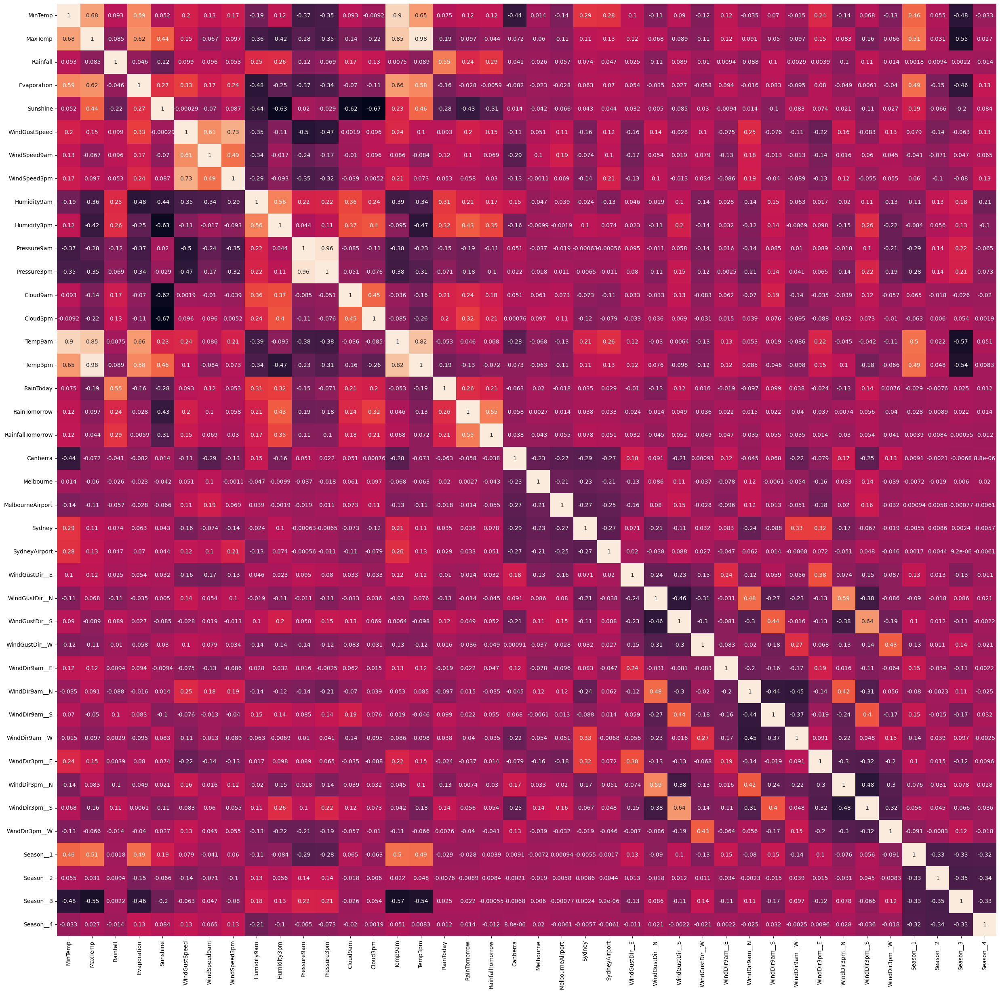

In [29]:
plt.figure(figsize=(30, 30))
sbn.heatmap(scaled_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

### Regresión Lineal Simple

In [30]:
x = scaled_data.copy()
y = x["RainfallTomorrow"].copy()
x.drop("RainfallTomorrow", axis=1, inplace=True)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)


r2 = r2_score( y_test, y_pred)
m_e2 = mean_squared_error( y_test, y_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 


score R2: 0.3513
error MSE: 0.6997


# Regresión Lineal sin tratamientos de los datos
Aplicaremos una regresión lineal borrando todos los datos despues de realizar el encoding de las variables y sin interpolar ningun dato.

In [31]:
full_data_encoded.dropna(inplace=True)
full_data_encoded[numerical_vars] = scale.fit_transform(full_data_encoded[numerical_vars])

fx = full_data_encoded.copy()
fy = fx["RainfallTomorrow"].copy()
fx.drop("RainfallTomorrow", axis=1, inplace=True)
fx_train, fx_test, fy_train, fy_test = train_test_split(fx, fy, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(fx_train, fy_train)
fy_pred = model.predict(fx_test)

r2 = r2_score( fy_test, fy_pred)
m_e2 = mean_squared_error( fy_test, fy_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 

score R2: 0.4012
error MSE: 0.4243


## Conclusión Regresion Lineal
<p>Se puede ver que a pesar del esfuerzo al completar y normalizar los datos, el modelo lineal no se ajusta bien para la predicción de RainfallTomorrow con un score de 0.35. </p>
<p>Tiene mejor score y un error mas bajo al realizar un drop directamente sobre los datos nulos, por lo que seguiremos usando este set de datos en vez del interpolado.</p>

# Regularización y Regresiones Lasso, Ridge y ElasticNet 

In [32]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, ElasticNetCV, LassoCV

lr = LinearRegression()
lr.fit(fx, fy)

print("Coeficientes del modelo de regresión lineal:")
#print(lr.coef_)
print(lr.score(fx,fy))

for alpha, ratio in [(0.9,0.2), (0.6,0.5), (0.3,0.5), (0.2,0.5), (0.1,0.3),
                     (0.01,0.9), (0.001,0.7), (0.0001,0.2), (0.00001,0.5), (0.000001,0.9)]:
    lasso = Lasso(alpha=0.1)
    ridge = Ridge(alpha=0.1) 
    elasticnet = ElasticNet(alpha=alpha, l1_ratio=ratio)

    lasso.fit(fx, fy)
    ridge.fit(fx, fy)
    elasticnet.fit(fx,fy)


    print(f"\nAlpha: {alpha} Ratio {ratio}")
    #print(lasso.coef_)
    print(f"Lasso Coef: {round(lasso.score(fx,fy), 4)}")

    #print(ridge.coef_)
    print(f"Ridge Coef: {round(ridge.score(fx,fy), 4)}")

    #print(elasticnet.coef_)
    print(f"ElasticNet : {round(elasticnet.score(fx,fy), 4)}")

Coeficientes del modelo de regresión lineal:
0.3461322188219069

Alpha: 0.9 Ratio 0.2
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.0815

Alpha: 0.6 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.0163

Alpha: 0.3 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.149

Alpha: 0.2 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.2211

Alpha: 0.1 Ratio 0.3
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.2973

Alpha: 0.01 Ratio 0.9
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3383

Alpha: 0.001 Ratio 0.7
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3459


/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.440e+00, tolerance: 1.067e+00
  model = cd_fast.enet_coordinate_descent(



Alpha: 0.0001 Ratio 0.2
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461

Alpha: 1e-05 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461

Alpha: 1e-06 Ratio 0.9
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461


/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.036e+03, tolerance: 1.067e+00
  model = cd_fast.enet_coordinate_descent(


# Regularizacion y Regresiones Lasso, Ridge y ElasticNet Cross Validation 

In [33]:
lassoCV = LassoCV() 
ridgeCV = RidgeCV() 
elasticnetCV = ElasticNetCV()

lassoCV.fit(fx, fy)
ridgeCV.fit(fx, fy)
elasticnetCV.fit(fx,fy)

print("lasso alpha:",lassoCV.alpha_)
print("ridge alpha:",ridgeCV.alpha_)
print("elastic net alpha:",elasticnetCV.alpha_ )

# Mostrar coeficientes
print("\nCoeficientes del modelo Lasso:")
#print(lassoCV.coef_)
print(round(lassoCV.score(fx,fy), 4))

print("\nCoeficientes del modelo Ridge:")
#print(ridgeCV.coef_)
print(round(ridgeCV.score(fx,fy), 4))


print("\nCoeficientes del modelo ElasticNet:")
#print(elasticnetCV.coef_)
print(round(elasticnetCV.score(fx,fy), 4))

lasso alpha: 0.0011696690144337191
ridge alpha: 10.0
elastic net alpha: 0.0007144000326480332

Coeficientes del modelo Lasso:
0.3456

Coeficientes del modelo Ridge:
0.3461

Coeficientes del modelo ElasticNet:
0.346


## Analizar variables para clasificación
El propósito es ver qué variables nos permiten diferenciar correctamente si llueve o no.
Dado que ya realizamos un análisis previo de las variables para la regresión lineal no hay mucho análisis para agregar ya que la variable RainfallTomorrow explica la columna RainTomorrow

In [34]:
dfclas = data.copy()

<Figure size 640x480 with 0 Axes>

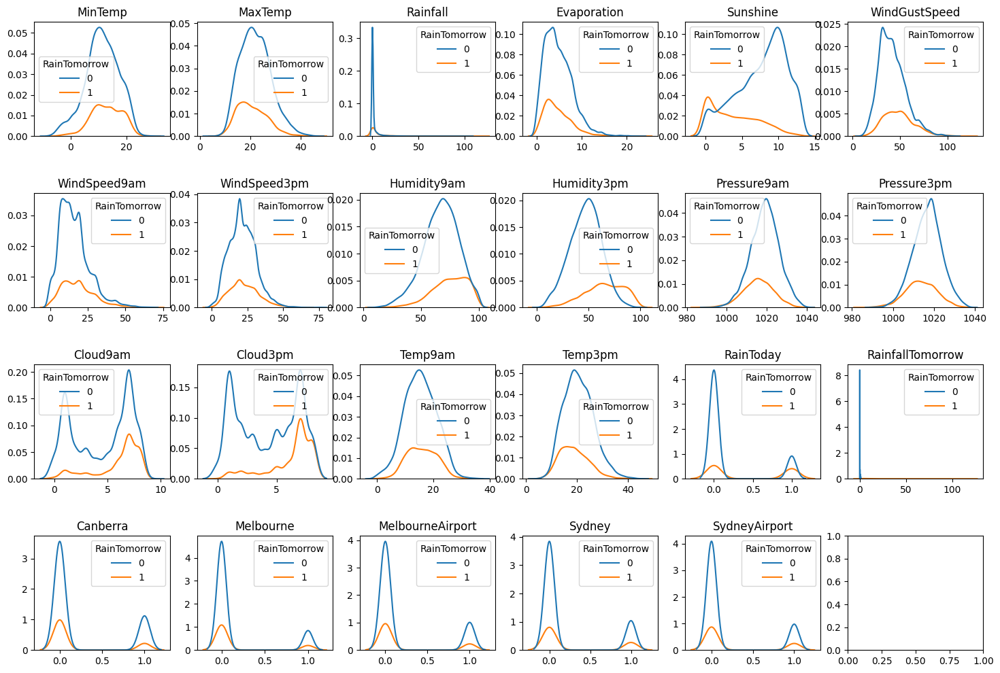

In [35]:
cols = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'RainToday', 'RainfallTomorrow',
       'Canberra', 'Melbourne', 'MelbourneAirport', 'Sydney', 'SydneyAirport']
filas = 4
columnas = 6
plt.figure()
fig, axs = plt.subplots(filas, columnas, figsize=(18, 12))
fig.subplots_adjust(hspace=0.5)
for i, columna in enumerate(cols):
    f = i // columnas
    c = i % columnas
    sbn.kdeplot(dfclas, x=columna, hue="RainTomorrow", ax=axs[f, c])
    axs[f, c].set_title(columna)
    axs[f, c].set_xlabel('')
    axs[f, c].set_ylabel('')
plt.show()

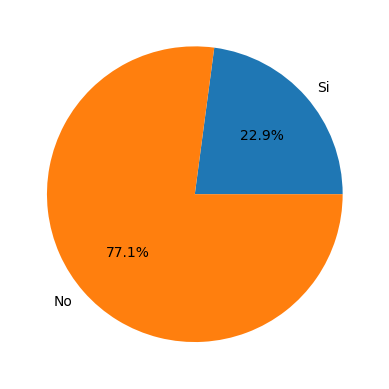

In [36]:
tot_no = data["RainTomorrow"].value_counts()[0]
tot_si = data["RainTomorrow"].value_counts()[1]
porcentaje_si = round(tot_si / (tot_no + tot_si) * 100, 2)
porcentaje_no = round(tot_no / (tot_no + tot_si) * 100, 2)
data_cantidad = pd.DataFrame(columns=["RainTomorrow", "%"], index=["Si", "No", "Total"], data=[
    [tot_si, porcentaje_si],
    [tot_no, porcentaje_no],
    [tot_si + tot_no, porcentaje_si + porcentaje_no]
])

plt.figure()
plt.pie([tot_si, tot_no], labels=["Si", "No"], autopct='%1.1f%%')
plt.show()

In [37]:
data_cantidad

,RainTomorrow,%
Si,3443,22.9
No,11593,77.1
Total,15036,100.0


Podemos ver que hay una desproporción en la cantidad de casos de lluvia con los de no lluvia. Si utilizamos el dataset como actualmente está obtendremos un modelo sesgado que tendrá preferencia por los dias de no lluvia. Para esto podemos utilizar diferentes técnicas para mantener el dataset proporcionado:
* Pesos de clase: A la clase LogisticRegression podemos setear el parámetro class_weight a "balanced" para dar más peso a los registros de lluvia
* Submuestreo: Eliminar registros de no lluvia hasta equiparar los de lluvia.
* Sobremuestreo: Generar información sintética para aumetar los registros de lluvia.

## Pesos de clase

In [38]:
logmodel = LogisticRegression(class_weight="balanced", random_state=42, max_iter=1000)

In [39]:
dflogx = full_data_encoded.copy()
dflogy = dflogx["RainTomorrow"].copy()
dflogx.drop("RainTomorrow", axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dflogx, dflogy, test_size=0.3, random_state=42)
logmodel.fit(X_train, y_train)

LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)

In [40]:
y_predict = logmodel.predict(X_test)
conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_predict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))

[[2410   22]
 [   9  760]]
              precision    recall  f1-score   support

           0       1.00      0.99      0.99      2432
           1       0.97      0.99      0.98       769

    accuracy                           0.99      3201
   macro avg       0.98      0.99      0.99      3201
weighted avg       0.99      0.99      0.99      3201



In [41]:
conf_matrix

,Negativo Predicho,Positivo Predicho
Real Negativo,2410,22
Real Positivo,9,760


## Submuestreo
Para el submuestreo vamos a crear una función que elimine aleatoriamente registros de una clase para así poder equilibrar el dataframe

In [42]:
def submuestreo(df: pd.DataFrame, columna: str):
    clases = df[columna].unique()
    clases_count = df[columna].value_counts()
    #Encontrar clase con menor frecuencia
    clase_menor = clases_count.idxmin()
    #Iterar y seleccionar aleatoriamente un nro igual de muestras de cada clase
    clase_menor_count = clases_count[clase_menor]
    data_generada = pd.DataFrame(columns=df.columns)
    dataframes = []
    for clase_target in clases:
        clase_data = df[df[columna] == clase_target]
        if clase_target != clase_menor:
            dataframes.append(clase_data.sample(clase_menor_count, replace=False))
        else:
            dataframes.append(clase_data)
    data_generada = pd.concat(dataframes)
    return data_generada

In [43]:
full_data_encoded["RainTomorrow"].value_counts()

RainTomorrow
0    8176
1    2494
Name: count, dtype: int64

([<matplotlib.patches.Wedge at 0x7f7c072d4ee0>,
 [Text(6.735557395310444e-17, 1.1, 'Si'),
  Text(-2.0206672185931328e-16, -1.1, 'No')],
 [Text(3.6739403974420595e-17, 0.6, '50.0%'),
  Text(-1.1021821192326178e-16, -0.6, '50.0%')])

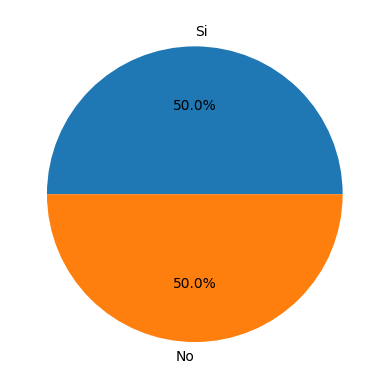

In [44]:
dfsub = submuestreo(full_data_encoded, "RainTomorrow")
plt.pie(dfsub["RainTomorrow"].value_counts(), labels=["Si", "No"], autopct='%1.1f%%')

In [45]:
logmodel = LogisticRegression(random_state=42)
dflogx = dfsub.copy()
dflogy = dflogx["RainTomorrow"].copy()
dflogx.drop("RainTomorrow", axis=1, inplace=True)
X_train, X_test, y_train, y_test = train_test_split(dflogx, dflogy, test_size=0.3, random_state=42)
logmodel.fit(X_train, y_train)

LogisticRegression(random_state=42)

In [46]:
y_predict = logmodel.predict(X_test)
conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_predict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
print(confusion_matrix(y_test, y_predict))
print(classification_report(y_test, y_predict))

[[762   5]
 [ 15 715]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       767
           1       0.99      0.98      0.99       730

    accuracy                           0.99      1497
   macro avg       0.99      0.99      0.99      1497
weighted avg       0.99      0.99      0.99      1497



In [47]:
conf_matrix

,Negativo Predicho,Positivo Predicho
Real Negativo,762,5
Real Positivo,15,715


## SMOTE
Esta librería realiza los siguientes pasos para equilibrar el dataset
1. Para cada fila de la clase minoritaria, se identifican sus k vecinos más cercanos
2. Se selecciona aleatoriamente uno de los vecinos cercanos y se lo etiqueta como *Vecino Cercano*
3. Se elige un valor aleatorio entre 0 y 1, luego multiplica la diferencia entre la instancia actual y el *Vecino Cercano* por el valor aleatorio. Este resultado se suma a la instancia actual para crear una nueva con diferentes datos

In [137]:
dfsx = dfsub.copy()
dfsy = dfsx["RainTomorrow"].copy()
dfsx.drop("RainTomorrow", axis=1, inplace=True)
smote = SMOTE(random_state=42)
xsmote, ysmote = smote.fit_resample(dfsx, dfsy)
X_train, X_test, y_train, y_test = train_test_split(xsmote, ysmote, test_size=0.3, random_state=42)

In [138]:
logmodel = LogisticRegression(random_state=42, max_iter=1000)
logmodel.fit(X_train, y_train)
logpredict = logmodel.predict(X_test)

In [139]:
print(confusion_matrix(y_test, logpredict))
print(classification_report(y_test, logpredict))

[[762   5]
 [ 15 715]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       767
           1       0.99      0.98      0.99       730

    accuracy                           0.99      1497
   macro avg       0.99      0.99      0.99      1497
weighted avg       0.99      0.99      0.99      1497



In [140]:
confusion_matrix_smote = pd.DataFrame(confusion_matrix(y_test, logpredict), columns=["Negativo Predicho", "Positivo Predicho"], index=["Real Negativo", "Real Positivo"])
confusion_matrix_smote

,Negativo Predicho,Positivo Predicho
Real Negativo,762,5
Real Positivo,15,715


## Conclusión
Vemos que cualquiera de los tres métodos son útiles ya que en todos obtenemos *precision*, *recall* y *f1-score* de 0.99 y 0.98. Además, en todas las matrices de confusión podemos ver que hay muchos Negativos Positivos y Reales Positivos

## Redes neuronales con Tensorflow

In [298]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Input, Dropout
from tensorflow.keras.models import clone_model
import os
import optuna
tf.config.run_functions_eagerly(True)
tf.data.experimental.enable_debug_mode()

#### Crear modelo para clasificación (Llueve / No llueve)

In [234]:
def objetivo_clas(trial: optuna.trial.Trial):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer_{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1, activation="sigmoid"))
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
    model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)
    score = model.evaluate(X_test, y_test, verbose=0)
    return score[1]

Se define una función objetivo para poder encontrar los mejores hiperparámetros para el modelo. Luego, se utiliza *optuna* para maximizar la función

In [235]:
estudio = optuna.create_study(direction="maximize")
estudio.optimize(objetivo_clas, n_trials=50)

[I 2023-11-20 15:04:26,500] A new study created in memory with name: no-name-48feea75-a1af-47db-ae9c-44cb1ea22a41


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.5318 - accuracy: 0.7273 - val_loss: 0.4607 - val_accuracy: 0.7762
Epoch 2/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4239 - accuracy: 0.8098 - val_loss: 0.4056 - val_accuracy: 0.8090
Epoch 3/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3704 - accuracy: 0.8364 - val_loss: 0.3653 - val_accuracy: 0.8397
Epoch 4/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3301 - accuracy: 0.8605 - val_loss: 0.3287 - val_accuracy: 0.8564
Epoch 5/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2943 - accuracy: 0.8820 - val_loss: 0.2984 - val_accuracy: 0.8751
Epoch 6/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2642 - accuracy: 0.8957 - val_loss: 0.2706 - val_accuracy: 0.8871
Epoch 7/10
110/110 [==============================] - 1s 14ms/step - loss: 0.2359 - accuracy: 0.9078 - val_loss: 0.2459 - val_accuracy: 0.9025

[I 2023-11-20 15:04:41,901] Trial 0 finished with value: 0.9392117857933044 and parameters: {'num_layers': 1, 'n_units_layer_0': 21}. Best is trial 0 with value: 0.9392117857933044.


Epoch 1/10
110/110 [==============================] - 2s 16ms/step - loss: 0.4263 - accuracy: 0.8029 - val_loss: 0.3278 - val_accuracy: 0.8530
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2579 - accuracy: 0.8923 - val_loss: 0.2291 - val_accuracy: 0.9085
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1662 - accuracy: 0.9421 - val_loss: 0.1651 - val_accuracy: 0.9439
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1074 - accuracy: 0.9630 - val_loss: 0.1081 - val_accuracy: 0.9706
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0691 - accuracy: 0.9817 - val_loss: 0.0834 - val_accuracy: 0.9693
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0478 - accuracy: 0.9877 - val_loss: 0.0647 - val_accuracy: 0.9773
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0360 - accuracy: 0.9903 - val_loss: 0.0538 - val_accuracy: 0.9780

[I 2023-11-20 15:05:00,377] Trial 1 finished with value: 0.9879759550094604 and parameters: {'num_layers': 2, 'n_units_layer_0': 57, 'n_units_layer_1': 70}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3937 - accuracy: 0.8215 - val_loss: 0.2900 - val_accuracy: 0.8717
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2098 - accuracy: 0.9181 - val_loss: 0.1645 - val_accuracy: 0.9379
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1074 - accuracy: 0.9671 - val_loss: 0.0995 - val_accuracy: 0.9619
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0636 - accuracy: 0.9779 - val_loss: 0.0633 - val_accuracy: 0.9773
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0409 - accuracy: 0.9874 - val_loss: 0.0521 - val_accuracy: 0.9806
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0247 - accuracy: 0.9966 - val_loss: 0.0386 - val_accuracy: 0.9873
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0181 - accuracy: 0.9966 - val_loss: 0.0625 - val_accuracy: 0.9693

[I 2023-11-20 15:05:18,872] Trial 2 finished with value: 0.9832999110221863 and parameters: {'num_layers': 2, 'n_units_layer_0': 123, 'n_units_layer_1': 93}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 22ms/step - loss: 0.3841 - accuracy: 0.8273 - val_loss: 0.2454 - val_accuracy: 0.8971
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1658 - accuracy: 0.9353 - val_loss: 0.1251 - val_accuracy: 0.9419
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0817 - accuracy: 0.9705 - val_loss: 0.0649 - val_accuracy: 0.9699
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0487 - accuracy: 0.9802 - val_loss: 0.0659 - val_accuracy: 0.9719
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0356 - accuracy: 0.9868 - val_loss: 0.0557 - val_accuracy: 0.9773
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0261 - accuracy: 0.9891 - val_loss: 0.0980 - val_accuracy: 0.9626
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0198 - accuracy: 0.9914 - val_loss: 0.0778 - val_accuracy: 0.9760

[I 2023-11-20 15:05:43,177] Trial 3 finished with value: 0.9665998816490173 and parameters: {'num_layers': 4, 'n_units_layer_0': 97, 'n_units_layer_1': 54, 'n_units_layer_2': 138, 'n_units_layer_3': 23}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 19ms/step - loss: 0.3812 - accuracy: 0.8195 - val_loss: 0.2608 - val_accuracy: 0.8925
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1727 - accuracy: 0.9295 - val_loss: 0.1584 - val_accuracy: 0.9459
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0817 - accuracy: 0.9685 - val_loss: 0.0753 - val_accuracy: 0.9719
Epoch 4/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0426 - accuracy: 0.9865 - val_loss: 0.0623 - val_accuracy: 0.9806
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0286 - accuracy: 0.9888 - val_loss: 0.0650 - val_accuracy: 0.9760
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0241 - accuracy: 0.9914 - val_loss: 0.0656 - val_accuracy: 0.9766
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0106 - accuracy: 0.9968 - val_loss: 0.0716 - val_accuracy: 0.9706

[I 2023-11-20 15:06:04,920] Trial 4 finished with value: 0.9826319217681885 and parameters: {'num_layers': 3, 'n_units_layer_0': 91, 'n_units_layer_1': 76, 'n_units_layer_2': 148}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 22ms/step - loss: 0.4720 - accuracy: 0.7688 - val_loss: 0.3897 - val_accuracy: 0.8176
Epoch 2/10
110/110 [==============================] - 2s 23ms/step - loss: 0.3333 - accuracy: 0.8525 - val_loss: 0.3215 - val_accuracy: 0.8584
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.2471 - accuracy: 0.8966 - val_loss: 0.2277 - val_accuracy: 0.9038
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1778 - accuracy: 0.9287 - val_loss: 0.1655 - val_accuracy: 0.9312
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1227 - accuracy: 0.9507 - val_loss: 0.1119 - val_accuracy: 0.9559
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0851 - accuracy: 0.9676 - val_loss: 0.0986 - val_accuracy: 0.9613
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0726 - accuracy: 0.9705 - val_loss: 0.0897 - val_accuracy: 0.9639

[I 2023-11-20 15:06:29,476] Trial 5 finished with value: 0.9686038494110107 and parameters: {'num_layers': 4, 'n_units_layer_0': 15, 'n_units_layer_1': 198, 'n_units_layer_2': 95, 'n_units_layer_3': 125}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3537 - accuracy: 0.8450 - val_loss: 0.2051 - val_accuracy: 0.9152
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1381 - accuracy: 0.9479 - val_loss: 0.1202 - val_accuracy: 0.9419
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0793 - accuracy: 0.9711 - val_loss: 0.0650 - val_accuracy: 0.9739
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0515 - accuracy: 0.9820 - val_loss: 0.0824 - val_accuracy: 0.9679
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0296 - accuracy: 0.9900 - val_loss: 0.0855 - val_accuracy: 0.9666
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0273 - accuracy: 0.9900 - val_loss: 0.0831 - val_accuracy: 0.9726
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0207 - accuracy: 0.9920 - val_loss: 0.0482 - val_accuracy: 0.9800

[I 2023-11-20 15:06:54,301] Trial 6 finished with value: 0.9839679598808289 and parameters: {'num_layers': 4, 'n_units_layer_0': 114, 'n_units_layer_1': 79, 'n_units_layer_2': 82, 'n_units_layer_3': 173}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 16ms/step - loss: 0.5071 - accuracy: 0.7571 - val_loss: 0.4096 - val_accuracy: 0.8083
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.3505 - accuracy: 0.8467 - val_loss: 0.3326 - val_accuracy: 0.8530
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2681 - accuracy: 0.8926 - val_loss: 0.2576 - val_accuracy: 0.8904
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1981 - accuracy: 0.9232 - val_loss: 0.1888 - val_accuracy: 0.9245
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1395 - accuracy: 0.9524 - val_loss: 0.1535 - val_accuracy: 0.9405
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1012 - accuracy: 0.9651 - val_loss: 0.1050 - val_accuracy: 0.9646
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0719 - accuracy: 0.9805 - val_loss: 0.0794 - val_accuracy: 0.9786

[I 2023-11-20 15:07:12,666] Trial 7 finished with value: 0.9819639325141907 and parameters: {'num_layers': 2, 'n_units_layer_0': 44, 'n_units_layer_1': 18}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.5140 - accuracy: 0.7625 - val_loss: 0.3975 - val_accuracy: 0.8270
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.3187 - accuracy: 0.8619 - val_loss: 0.2958 - val_accuracy: 0.8751
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2217 - accuracy: 0.9095 - val_loss: 0.2517 - val_accuracy: 0.8925
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1567 - accuracy: 0.9393 - val_loss: 0.1539 - val_accuracy: 0.9332
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1087 - accuracy: 0.9608 - val_loss: 0.1107 - val_accuracy: 0.9526
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0695 - accuracy: 0.9757 - val_loss: 0.0791 - val_accuracy: 0.9686
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0475 - accuracy: 0.9848 - val_loss: 0.0661 - val_accuracy: 0.9766

[I 2023-11-20 15:07:34,014] Trial 8 finished with value: 0.9819639325141907 and parameters: {'num_layers': 3, 'n_units_layer_0': 21, 'n_units_layer_1': 118, 'n_units_layer_2': 12}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.5357 - accuracy: 0.7241 - val_loss: 0.4205 - val_accuracy: 0.8056
Epoch 2/10
110/110 [==============================] - 1s 13ms/step - loss: 0.3680 - accuracy: 0.8399 - val_loss: 0.3482 - val_accuracy: 0.8484
Epoch 3/10
110/110 [==============================] - 1s 13ms/step - loss: 0.3020 - accuracy: 0.8728 - val_loss: 0.2971 - val_accuracy: 0.8737
Epoch 4/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2524 - accuracy: 0.9049 - val_loss: 0.2531 - val_accuracy: 0.9011
Epoch 5/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2126 - accuracy: 0.9229 - val_loss: 0.2155 - val_accuracy: 0.9225
Epoch 6/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1795 - accuracy: 0.9419 - val_loss: 0.1868 - val_accuracy: 0.9319
Epoch 7/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1533 - accuracy: 0.9527 - val_loss: 0.1607 - val_accuracy: 0.9479

[I 2023-11-20 15:07:49,328] Trial 9 finished with value: 0.9719439148902893 and parameters: {'num_layers': 1, 'n_units_layer_0': 95}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3439 - accuracy: 0.8482 - val_loss: 0.2401 - val_accuracy: 0.8911
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1554 - accuracy: 0.9427 - val_loss: 0.1252 - val_accuracy: 0.9519
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0773 - accuracy: 0.9728 - val_loss: 0.0835 - val_accuracy: 0.9626
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0420 - accuracy: 0.9888 - val_loss: 0.0515 - val_accuracy: 0.9826
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0243 - accuracy: 0.9946 - val_loss: 0.0606 - val_accuracy: 0.9773
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0185 - accuracy: 0.9957 - val_loss: 0.0546 - val_accuracy: 0.9780
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0193 - accuracy: 0.9948 - val_loss: 0.0395 - val_accuracy: 0.9840

[I 2023-11-20 15:08:08,016] Trial 10 finished with value: 0.9859719276428223 and parameters: {'num_layers': 2, 'n_units_layer_0': 199, 'n_units_layer_1': 141}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3434 - accuracy: 0.8502 - val_loss: 0.2269 - val_accuracy: 0.9172
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1445 - accuracy: 0.9473 - val_loss: 0.1177 - val_accuracy: 0.9559
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0768 - accuracy: 0.9739 - val_loss: 0.0654 - val_accuracy: 0.9746
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0431 - accuracy: 0.9860 - val_loss: 0.0878 - val_accuracy: 0.9699
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0316 - accuracy: 0.9908 - val_loss: 0.0510 - val_accuracy: 0.9793
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0199 - accuracy: 0.9951 - val_loss: 0.0362 - val_accuracy: 0.9853
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0135 - accuracy: 0.9960 - val_loss: 0.0453 - val_accuracy: 0.9833

[I 2023-11-20 15:08:26,889] Trial 11 finished with value: 0.9873079657554626 and parameters: {'num_layers': 2, 'n_units_layer_0': 195, 'n_units_layer_1': 147}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3372 - accuracy: 0.8531 - val_loss: 0.2382 - val_accuracy: 0.8945
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1581 - accuracy: 0.9430 - val_loss: 0.1592 - val_accuracy: 0.9245
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0758 - accuracy: 0.9745 - val_loss: 0.0742 - val_accuracy: 0.9726
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0387 - accuracy: 0.9885 - val_loss: 0.0556 - val_accuracy: 0.9786
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0242 - accuracy: 0.9937 - val_loss: 0.0521 - val_accuracy: 0.9773
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0208 - accuracy: 0.9937 - val_loss: 0.0428 - val_accuracy: 0.9866
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0174 - accuracy: 0.9943 - val_loss: 0.0278 - val_accuracy: 0.9886

[I 2023-11-20 15:08:45,689] Trial 12 finished with value: 0.9712758660316467 and parameters: {'num_layers': 2, 'n_units_layer_0': 180, 'n_units_layer_1': 170}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4481 - accuracy: 0.7920 - val_loss: 0.3823 - val_accuracy: 0.8317
Epoch 2/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3243 - accuracy: 0.8622 - val_loss: 0.3158 - val_accuracy: 0.8591
Epoch 3/10
110/110 [==============================] - 1s 14ms/step - loss: 0.2600 - accuracy: 0.8932 - val_loss: 0.2535 - val_accuracy: 0.9025
Epoch 4/10
110/110 [==============================] - 1s 14ms/step - loss: 0.2033 - accuracy: 0.9270 - val_loss: 0.2034 - val_accuracy: 0.9272
Epoch 5/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1607 - accuracy: 0.9493 - val_loss: 0.1624 - val_accuracy: 0.9432
Epoch 6/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1287 - accuracy: 0.9630 - val_loss: 0.1331 - val_accuracy: 0.9646
Epoch 7/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1036 - accuracy: 0.9708 - val_loss: 0.1075 - val_accuracy: 0.9659

[I 2023-11-20 15:09:01,037] Trial 13 finished with value: 0.9819639325141907 and parameters: {'num_layers': 1, 'n_units_layer_0': 147}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3786 - accuracy: 0.8313 - val_loss: 0.2484 - val_accuracy: 0.8958
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1766 - accuracy: 0.9324 - val_loss: 0.1479 - val_accuracy: 0.9472
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0854 - accuracy: 0.9693 - val_loss: 0.0918 - val_accuracy: 0.9586
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0581 - accuracy: 0.9777 - val_loss: 0.0826 - val_accuracy: 0.9659
Epoch 5/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0243 - accuracy: 0.9923 - val_loss: 0.0876 - val_accuracy: 0.9646
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0303 - accuracy: 0.9903 - val_loss: 0.1331 - val_accuracy: 0.9512
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0223 - accuracy: 0.9917 - val_loss: 0.0644 - val_accuracy: 0.9713

[I 2023-11-20 15:09:22,856] Trial 14 finished with value: 0.9772878885269165 and parameters: {'num_layers': 3, 'n_units_layer_0': 60, 'n_units_layer_1': 135, 'n_units_layer_2': 198}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 16ms/step - loss: 0.4381 - accuracy: 0.8001 - val_loss: 0.3525 - val_accuracy: 0.8497
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2860 - accuracy: 0.8788 - val_loss: 0.2626 - val_accuracy: 0.8918
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1859 - accuracy: 0.9301 - val_loss: 0.1740 - val_accuracy: 0.9359
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1195 - accuracy: 0.9619 - val_loss: 0.1140 - val_accuracy: 0.9593
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0794 - accuracy: 0.9748 - val_loss: 0.0845 - val_accuracy: 0.9713
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0550 - accuracy: 0.9851 - val_loss: 0.0864 - val_accuracy: 0.9699
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0439 - accuracy: 0.9874 - val_loss: 0.0556 - val_accuracy: 0.9813

[I 2023-11-20 15:09:41,084] Trial 15 finished with value: 0.9839679598808289 and parameters: {'num_layers': 2, 'n_units_layer_0': 62, 'n_units_layer_1': 41}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 19ms/step - loss: 0.3641 - accuracy: 0.8362 - val_loss: 0.2509 - val_accuracy: 0.8904
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1551 - accuracy: 0.9456 - val_loss: 0.2583 - val_accuracy: 0.9025
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0731 - accuracy: 0.9728 - val_loss: 0.0597 - val_accuracy: 0.9800
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0332 - accuracy: 0.9891 - val_loss: 0.0571 - val_accuracy: 0.9793
Epoch 5/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0217 - accuracy: 0.9928 - val_loss: 0.0469 - val_accuracy: 0.9806
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0133 - accuracy: 0.9971 - val_loss: 0.0559 - val_accuracy: 0.9833
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0139 - accuracy: 0.9948 - val_loss: 0.0756 - val_accuracy: 0.9719

[I 2023-11-20 15:10:02,935] Trial 16 finished with value: 0.9772878885269165 and parameters: {'num_layers': 3, 'n_units_layer_0': 153, 'n_units_layer_1': 160, 'n_units_layer_2': 25}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4755 - accuracy: 0.7789 - val_loss: 0.4000 - val_accuracy: 0.8176
Epoch 2/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3569 - accuracy: 0.8447 - val_loss: 0.3404 - val_accuracy: 0.8544
Epoch 3/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3019 - accuracy: 0.8740 - val_loss: 0.2979 - val_accuracy: 0.8751
Epoch 4/10
110/110 [==============================] - 1s 14ms/step - loss: 0.2551 - accuracy: 0.9006 - val_loss: 0.2571 - val_accuracy: 0.8938
Epoch 5/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2178 - accuracy: 0.9207 - val_loss: 0.2198 - val_accuracy: 0.9152
Epoch 6/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1842 - accuracy: 0.9376 - val_loss: 0.1907 - val_accuracy: 0.9265
Epoch 7/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1564 - accuracy: 0.9504 - val_loss: 0.1629 - val_accuracy: 0.9492

[I 2023-11-20 15:10:18,403] Trial 17 finished with value: 0.9726119041442871 and parameters: {'num_layers': 1, 'n_units_layer_0': 71}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 18ms/step - loss: 0.3737 - accuracy: 0.8324 - val_loss: 0.2795 - val_accuracy: 0.8751
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1972 - accuracy: 0.9270 - val_loss: 0.1550 - val_accuracy: 0.9372
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1014 - accuracy: 0.9668 - val_loss: 0.0931 - val_accuracy: 0.9673
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0571 - accuracy: 0.9822 - val_loss: 0.0669 - val_accuracy: 0.9766
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0356 - accuracy: 0.9908 - val_loss: 0.0484 - val_accuracy: 0.9780
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0303 - accuracy: 0.9891 - val_loss: 0.0445 - val_accuracy: 0.9820
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0203 - accuracy: 0.9948 - val_loss: 0.0348 - val_accuracy: 0.9880

[I 2023-11-20 15:10:37,019] Trial 18 finished with value: 0.9879759550094604 and parameters: {'num_layers': 2, 'n_units_layer_0': 141, 'n_units_layer_1': 110}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3758 - accuracy: 0.8356 - val_loss: 0.2557 - val_accuracy: 0.8911
Epoch 2/10
110/110 [==============================] - 2s 20ms/step - loss: 0.1730 - accuracy: 0.9330 - val_loss: 0.1522 - val_accuracy: 0.9479
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0724 - accuracy: 0.9762 - val_loss: 0.0697 - val_accuracy: 0.9673
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0427 - accuracy: 0.9831 - val_loss: 0.1079 - val_accuracy: 0.9559
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0326 - accuracy: 0.9880 - val_loss: 0.0541 - val_accuracy: 0.9773
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0230 - accuracy: 0.9923 - val_loss: 0.0820 - val_accuracy: 0.9706
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0167 - accuracy: 0.9946 - val_loss: 0.0600 - val_accuracy: 0.9766

[I 2023-11-20 15:10:59,016] Trial 19 finished with value: 0.9832999110221863 and parameters: {'num_layers': 3, 'n_units_layer_0': 141, 'n_units_layer_1': 106, 'n_units_layer_2': 51}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4499 - accuracy: 0.7834 - val_loss: 0.3715 - val_accuracy: 0.8343
Epoch 2/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3179 - accuracy: 0.8674 - val_loss: 0.3012 - val_accuracy: 0.8717
Epoch 3/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2520 - accuracy: 0.9017 - val_loss: 0.2504 - val_accuracy: 0.9058
Epoch 4/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2017 - accuracy: 0.9292 - val_loss: 0.2020 - val_accuracy: 0.9218
Epoch 5/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1581 - accuracy: 0.9490 - val_loss: 0.1597 - val_accuracy: 0.9432
Epoch 6/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1243 - accuracy: 0.9648 - val_loss: 0.1316 - val_accuracy: 0.9546
Epoch 7/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1017 - accuracy: 0.9739 - val_loss: 0.1090 - val_accuracy: 0.9673

[I 2023-11-20 15:11:14,775] Trial 20 finished with value: 0.9839679598808289 and parameters: {'num_layers': 1, 'n_units_layer_0': 164}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3539 - accuracy: 0.8447 - val_loss: 0.2444 - val_accuracy: 0.9005
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1595 - accuracy: 0.9441 - val_loss: 0.1303 - val_accuracy: 0.9579
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0861 - accuracy: 0.9708 - val_loss: 0.0712 - val_accuracy: 0.9760
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0436 - accuracy: 0.9854 - val_loss: 0.0521 - val_accuracy: 0.9833
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0401 - accuracy: 0.9851 - val_loss: 0.0431 - val_accuracy: 0.9826
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0215 - accuracy: 0.9931 - val_loss: 0.0423 - val_accuracy: 0.9853
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0144 - accuracy: 0.9960 - val_loss: 0.0440 - val_accuracy: 0.9873

[I 2023-11-20 15:11:33,951] Trial 21 finished with value: 0.9859719276428223 and parameters: {'num_layers': 2, 'n_units_layer_0': 196, 'n_units_layer_1': 122}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3669 - accuracy: 0.8376 - val_loss: 0.2721 - val_accuracy: 0.8844
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1873 - accuracy: 0.9301 - val_loss: 0.1493 - val_accuracy: 0.9379
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0920 - accuracy: 0.9702 - val_loss: 0.0903 - val_accuracy: 0.9626
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0515 - accuracy: 0.9857 - val_loss: 0.0583 - val_accuracy: 0.9853
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0366 - accuracy: 0.9885 - val_loss: 0.0461 - val_accuracy: 0.9826
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0211 - accuracy: 0.9963 - val_loss: 0.0485 - val_accuracy: 0.9813
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0164 - accuracy: 0.9963 - val_loss: 0.0322 - val_accuracy: 0.9880

[I 2023-11-20 15:11:52,731] Trial 22 finished with value: 0.9879759550094604 and parameters: {'num_layers': 2, 'n_units_layer_0': 178, 'n_units_layer_1': 67}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3952 - accuracy: 0.8167 - val_loss: 0.2895 - val_accuracy: 0.8771
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1983 - accuracy: 0.9247 - val_loss: 0.1651 - val_accuracy: 0.9452
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1094 - accuracy: 0.9648 - val_loss: 0.0984 - val_accuracy: 0.9619
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0606 - accuracy: 0.9828 - val_loss: 0.0686 - val_accuracy: 0.9726
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0383 - accuracy: 0.9908 - val_loss: 0.0501 - val_accuracy: 0.9826
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0278 - accuracy: 0.9931 - val_loss: 0.0474 - val_accuracy: 0.9820
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0235 - accuracy: 0.9946 - val_loss: 0.0367 - val_accuracy: 0.9853

[I 2023-11-20 15:12:11,544] Trial 23 finished with value: 0.9879759550094604 and parameters: {'num_layers': 2, 'n_units_layer_0': 172, 'n_units_layer_1': 58}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4273 - accuracy: 0.8075 - val_loss: 0.3324 - val_accuracy: 0.8430
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2449 - accuracy: 0.9032 - val_loss: 0.2072 - val_accuracy: 0.9118
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1482 - accuracy: 0.9479 - val_loss: 0.1230 - val_accuracy: 0.9639
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0874 - accuracy: 0.9722 - val_loss: 0.0873 - val_accuracy: 0.9733
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0538 - accuracy: 0.9860 - val_loss: 0.0597 - val_accuracy: 0.9813
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0397 - accuracy: 0.9903 - val_loss: 0.0571 - val_accuracy: 0.9806
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0436 - accuracy: 0.9848 - val_loss: 0.0503 - val_accuracy: 0.9806

[I 2023-11-20 15:12:29,968] Trial 24 finished with value: 0.9799599051475525 and parameters: {'num_layers': 2, 'n_units_layer_0': 139, 'n_units_layer_1': 30}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 19ms/step - loss: 0.3787 - accuracy: 0.8324 - val_loss: 0.2619 - val_accuracy: 0.8811
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1797 - accuracy: 0.9244 - val_loss: 0.1586 - val_accuracy: 0.9365
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0775 - accuracy: 0.9714 - val_loss: 0.0621 - val_accuracy: 0.9786
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0417 - accuracy: 0.9857 - val_loss: 0.0878 - val_accuracy: 0.9619
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0326 - accuracy: 0.9888 - val_loss: 0.0851 - val_accuracy: 0.9659
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0276 - accuracy: 0.9888 - val_loss: 0.0457 - val_accuracy: 0.9813
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0234 - accuracy: 0.9900 - val_loss: 0.0764 - val_accuracy: 0.9733

[I 2023-11-20 15:12:51,266] Trial 25 finished with value: 0.9832999110221863 and parameters: {'num_layers': 3, 'n_units_layer_0': 123, 'n_units_layer_1': 79, 'n_units_layer_2': 198}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4825 - accuracy: 0.7594 - val_loss: 0.3633 - val_accuracy: 0.8417
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.3072 - accuracy: 0.8654 - val_loss: 0.2740 - val_accuracy: 0.8811
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2187 - accuracy: 0.9123 - val_loss: 0.2096 - val_accuracy: 0.9198
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1545 - accuracy: 0.9476 - val_loss: 0.1427 - val_accuracy: 0.9459
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1000 - accuracy: 0.9693 - val_loss: 0.1038 - val_accuracy: 0.9633
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0712 - accuracy: 0.9774 - val_loss: 0.0864 - val_accuracy: 0.9666
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0488 - accuracy: 0.9863 - val_loss: 0.0601 - val_accuracy: 0.9800

[I 2023-11-20 15:13:09,501] Trial 26 finished with value: 0.9799599051475525 and parameters: {'num_layers': 2, 'n_units_layer_0': 42, 'n_units_layer_1': 63}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4919 - accuracy: 0.7571 - val_loss: 0.4041 - val_accuracy: 0.8243
Epoch 2/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3538 - accuracy: 0.8456 - val_loss: 0.3401 - val_accuracy: 0.8524
Epoch 3/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2938 - accuracy: 0.8777 - val_loss: 0.2912 - val_accuracy: 0.8764
Epoch 4/10
110/110 [==============================] - 1s 13ms/step - loss: 0.2462 - accuracy: 0.9043 - val_loss: 0.2514 - val_accuracy: 0.9005
Epoch 5/10
110/110 [==============================] - 1s 14ms/step - loss: 0.2071 - accuracy: 0.9238 - val_loss: 0.2146 - val_accuracy: 0.9132
Epoch 6/10
110/110 [==============================] - 1s 14ms/step - loss: 0.1755 - accuracy: 0.9444 - val_loss: 0.1806 - val_accuracy: 0.9392
Epoch 7/10
110/110 [==============================] - 1s 14ms/step - loss: 0.1473 - accuracy: 0.9553 - val_loss: 0.1567 - val_accuracy: 0.9486

[I 2023-11-20 15:13:24,808] Trial 27 finished with value: 0.9679358601570129 and parameters: {'num_layers': 1, 'n_units_layer_0': 77}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3888 - accuracy: 0.8235 - val_loss: 0.2867 - val_accuracy: 0.8771
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1852 - accuracy: 0.9315 - val_loss: 0.1529 - val_accuracy: 0.9432
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0924 - accuracy: 0.9699 - val_loss: 0.0904 - val_accuracy: 0.9713
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0571 - accuracy: 0.9799 - val_loss: 0.0690 - val_accuracy: 0.9719
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0320 - accuracy: 0.9923 - val_loss: 0.0511 - val_accuracy: 0.9813
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0331 - accuracy: 0.9880 - val_loss: 0.0504 - val_accuracy: 0.9846
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0170 - accuracy: 0.9963 - val_loss: 0.0357 - val_accuracy: 0.9846

[I 2023-11-20 15:13:43,858] Trial 28 finished with value: 0.9853039383888245 and parameters: {'num_layers': 2, 'n_units_layer_0': 160, 'n_units_layer_1': 97}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4270 - accuracy: 0.8064 - val_loss: 0.3524 - val_accuracy: 0.8424
Epoch 2/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3006 - accuracy: 0.8725 - val_loss: 0.2837 - val_accuracy: 0.8784
Epoch 3/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2315 - accuracy: 0.9092 - val_loss: 0.2299 - val_accuracy: 0.9138
Epoch 4/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1795 - accuracy: 0.9373 - val_loss: 0.1758 - val_accuracy: 0.9405
Epoch 5/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1405 - accuracy: 0.9588 - val_loss: 0.1454 - val_accuracy: 0.9492
Epoch 6/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1099 - accuracy: 0.9714 - val_loss: 0.1140 - val_accuracy: 0.9673
Epoch 7/10
110/110 [==============================] - 2s 14ms/step - loss: 0.0876 - accuracy: 0.9794 - val_loss: 0.0945 - val_accuracy: 0.9679

[I 2023-11-20 15:13:59,603] Trial 29 finished with value: 0.9879759550094604 and parameters: {'num_layers': 1, 'n_units_layer_0': 181}. Best is trial 1 with value: 0.9879759550094604.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4647 - accuracy: 0.7877 - val_loss: 0.3238 - val_accuracy: 0.8591
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2125 - accuracy: 0.9172 - val_loss: 0.1740 - val_accuracy: 0.9345
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0915 - accuracy: 0.9693 - val_loss: 0.0936 - val_accuracy: 0.9639
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0471 - accuracy: 0.9834 - val_loss: 0.0499 - val_accuracy: 0.9826
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0263 - accuracy: 0.9914 - val_loss: 0.0517 - val_accuracy: 0.9813
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0208 - accuracy: 0.9931 - val_loss: 0.0385 - val_accuracy: 0.9846
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0118 - accuracy: 0.9977 - val_loss: 0.0466 - val_accuracy: 0.9826

[I 2023-11-20 15:14:21,134] Trial 30 finished with value: 0.9886439442634583 and parameters: {'num_layers': 3, 'n_units_layer_0': 131, 'n_units_layer_1': 5, 'n_units_layer_2': 139}. Best is trial 30 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4454 - accuracy: 0.7909 - val_loss: 0.3130 - val_accuracy: 0.8637
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2094 - accuracy: 0.9192 - val_loss: 0.1651 - val_accuracy: 0.9285
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1026 - accuracy: 0.9633 - val_loss: 0.1048 - val_accuracy: 0.9552
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0528 - accuracy: 0.9802 - val_loss: 0.0649 - val_accuracy: 0.9793
Epoch 5/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0328 - accuracy: 0.9908 - val_loss: 0.0741 - val_accuracy: 0.9673
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0194 - accuracy: 0.9940 - val_loss: 0.0450 - val_accuracy: 0.9800
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0142 - accuracy: 0.9957 - val_loss: 0.0447 - val_accuracy: 0.9820

[I 2023-11-20 15:14:43,090] Trial 31 finished with value: 0.9806278944015503 and parameters: {'num_layers': 3, 'n_units_layer_0': 134, 'n_units_layer_1': 10, 'n_units_layer_2': 146}. Best is trial 30 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 2s 19ms/step - loss: 0.4082 - accuracy: 0.8141 - val_loss: 0.2902 - val_accuracy: 0.8697
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2030 - accuracy: 0.9166 - val_loss: 0.1647 - val_accuracy: 0.9265
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1009 - accuracy: 0.9605 - val_loss: 0.1132 - val_accuracy: 0.9566
Epoch 4/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0483 - accuracy: 0.9831 - val_loss: 0.0815 - val_accuracy: 0.9679
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0260 - accuracy: 0.9934 - val_loss: 0.0666 - val_accuracy: 0.9739
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0226 - accuracy: 0.9920 - val_loss: 0.0579 - val_accuracy: 0.9780
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0168 - accuracy: 0.9937 - val_loss: 0.0909 - val_accuracy: 0.9666

[I 2023-11-20 15:15:04,752] Trial 32 finished with value: 0.9792919158935547 and parameters: {'num_layers': 3, 'n_units_layer_0': 113, 'n_units_layer_1': 42, 'n_units_layer_2': 112}. Best is trial 30 with value: 0.9886439442634583.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3962 - accuracy: 0.8218 - val_loss: 0.3068 - val_accuracy: 0.8664
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2312 - accuracy: 0.9089 - val_loss: 0.1973 - val_accuracy: 0.9232
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1370 - accuracy: 0.9524 - val_loss: 0.1306 - val_accuracy: 0.9412
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0874 - accuracy: 0.9705 - val_loss: 0.0852 - val_accuracy: 0.9726
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0581 - accuracy: 0.9834 - val_loss: 0.0583 - val_accuracy: 0.9813
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0363 - accuracy: 0.9931 - val_loss: 0.0546 - val_accuracy: 0.9833
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0295 - accuracy: 0.9940 - val_loss: 0.0461 - val_accuracy: 0.9860

[I 2023-11-20 15:15:23,126] Trial 33 finished with value: 0.9899799823760986 and parameters: {'num_layers': 2, 'n_units_layer_0': 130, 'n_units_layer_1': 27}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4183 - accuracy: 0.8087 - val_loss: 0.3195 - val_accuracy: 0.8684
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2490 - accuracy: 0.8975 - val_loss: 0.2237 - val_accuracy: 0.9051
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1549 - accuracy: 0.9487 - val_loss: 0.1364 - val_accuracy: 0.9486
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0937 - accuracy: 0.9696 - val_loss: 0.0882 - val_accuracy: 0.9686
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0588 - accuracy: 0.9837 - val_loss: 0.0647 - val_accuracy: 0.9800
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0414 - accuracy: 0.9903 - val_loss: 0.0476 - val_accuracy: 0.9873
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0299 - accuracy: 0.9934 - val_loss: 0.0577 - val_accuracy: 0.9813

[I 2023-11-20 15:15:41,910] Trial 34 finished with value: 0.9799599051475525 and parameters: {'num_layers': 2, 'n_units_layer_0': 129, 'n_units_layer_1': 26}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 22ms/step - loss: 0.4890 - accuracy: 0.7625 - val_loss: 0.3312 - val_accuracy: 0.8597
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.2176 - accuracy: 0.9078 - val_loss: 0.1712 - val_accuracy: 0.9285
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0918 - accuracy: 0.9673 - val_loss: 0.0965 - val_accuracy: 0.9633
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0428 - accuracy: 0.9854 - val_loss: 0.0773 - val_accuracy: 0.9746
Epoch 5/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0272 - accuracy: 0.9914 - val_loss: 0.0769 - val_accuracy: 0.9733
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0225 - accuracy: 0.9934 - val_loss: 0.0746 - val_accuracy: 0.9719
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0200 - accuracy: 0.9928 - val_loss: 0.0525 - val_accuracy: 0.9833

[I 2023-11-20 15:16:06,329] Trial 35 finished with value: 0.9806278944015503 and parameters: {'num_layers': 4, 'n_units_layer_0': 109, 'n_units_layer_1': 4, 'n_units_layer_2': 169, 'n_units_layer_3': 8}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4218 - accuracy: 0.8127 - val_loss: 0.3289 - val_accuracy: 0.8550
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2322 - accuracy: 0.9089 - val_loss: 0.1842 - val_accuracy: 0.9252
Epoch 3/10
110/110 [==============================] - 2s 20ms/step - loss: 0.1216 - accuracy: 0.9556 - val_loss: 0.1136 - val_accuracy: 0.9599
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0686 - accuracy: 0.9759 - val_loss: 0.0885 - val_accuracy: 0.9666
Epoch 5/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0360 - accuracy: 0.9897 - val_loss: 0.0560 - val_accuracy: 0.9786
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0292 - accuracy: 0.9903 - val_loss: 0.0741 - val_accuracy: 0.9739
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0189 - accuracy: 0.9940 - val_loss: 0.0426 - val_accuracy: 0.9813

[I 2023-11-20 15:16:28,086] Trial 36 finished with value: 0.9859719276428223 and parameters: {'num_layers': 3, 'n_units_layer_0': 84, 'n_units_layer_1': 41, 'n_units_layer_2': 64}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4174 - accuracy: 0.7989 - val_loss: 0.3191 - val_accuracy: 0.8591
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2324 - accuracy: 0.9078 - val_loss: 0.2043 - val_accuracy: 0.9245
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1357 - accuracy: 0.9504 - val_loss: 0.1292 - val_accuracy: 0.9559
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0790 - accuracy: 0.9768 - val_loss: 0.0904 - val_accuracy: 0.9653
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0498 - accuracy: 0.9863 - val_loss: 0.0611 - val_accuracy: 0.9766
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0323 - accuracy: 0.9920 - val_loss: 0.0604 - val_accuracy: 0.9746
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0285 - accuracy: 0.9920 - val_loss: 0.0533 - val_accuracy: 0.9780

[I 2023-11-20 15:16:46,795] Trial 37 finished with value: 0.9792919158935547 and parameters: {'num_layers': 2, 'n_units_layer_0': 106, 'n_units_layer_1': 90}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 19ms/step - loss: 0.5471 - accuracy: 0.7284 - val_loss: 0.4696 - val_accuracy: 0.7789
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.4413 - accuracy: 0.7960 - val_loss: 0.4288 - val_accuracy: 0.7916
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.3942 - accuracy: 0.8178 - val_loss: 0.3956 - val_accuracy: 0.8136
Epoch 4/10
110/110 [==============================] - 2s 20ms/step - loss: 0.3521 - accuracy: 0.8410 - val_loss: 0.3476 - val_accuracy: 0.8410
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.3062 - accuracy: 0.8682 - val_loss: 0.3020 - val_accuracy: 0.8617
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.2577 - accuracy: 0.8897 - val_loss: 0.2524 - val_accuracy: 0.8931
Epoch 7/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1955 - accuracy: 0.9212 - val_loss: 0.1842 - val_accuracy: 0.9232

[I 2023-11-20 15:17:08,440] Trial 38 finished with value: 0.9839679598808289 and parameters: {'num_layers': 3, 'n_units_layer_0': 4, 'n_units_layer_1': 25, 'n_units_layer_2': 116}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 3s 23ms/step - loss: 0.3839 - accuracy: 0.8201 - val_loss: 0.2520 - val_accuracy: 0.8891
Epoch 2/10
110/110 [==============================] - 2s 22ms/step - loss: 0.1574 - accuracy: 0.9396 - val_loss: 0.1221 - val_accuracy: 0.9486
Epoch 3/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0815 - accuracy: 0.9682 - val_loss: 0.0873 - val_accuracy: 0.9613
Epoch 4/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0484 - accuracy: 0.9791 - val_loss: 0.0559 - val_accuracy: 0.9773
Epoch 5/10
110/110 [==============================] - 3s 23ms/step - loss: 0.0328 - accuracy: 0.9903 - val_loss: 0.0908 - val_accuracy: 0.9693
Epoch 6/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0314 - accuracy: 0.9903 - val_loss: 0.0548 - val_accuracy: 0.9760
Epoch 7/10
110/110 [==============================] - 2s 22ms/step - loss: 0.0180 - accuracy: 0.9928 - val_loss: 0.0674 - val_accuracy: 0.9739

[I 2023-11-20 15:17:33,427] Trial 39 finished with value: 0.9766198992729187 and parameters: {'num_layers': 4, 'n_units_layer_0': 121, 'n_units_layer_1': 48, 'n_units_layer_2': 163, 'n_units_layer_3': 197}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4676 - accuracy: 0.7849 - val_loss: 0.3566 - val_accuracy: 0.8417
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2828 - accuracy: 0.8851 - val_loss: 0.2636 - val_accuracy: 0.8978
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1916 - accuracy: 0.9315 - val_loss: 0.1875 - val_accuracy: 0.9218
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1281 - accuracy: 0.9576 - val_loss: 0.1209 - val_accuracy: 0.9559
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0873 - accuracy: 0.9745 - val_loss: 0.0903 - val_accuracy: 0.9726
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0626 - accuracy: 0.9842 - val_loss: 0.0668 - val_accuracy: 0.9806
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0457 - accuracy: 0.9908 - val_loss: 0.0530 - val_accuracy: 0.9853

[I 2023-11-20 15:17:52,109] Trial 40 finished with value: 0.9866399168968201 and parameters: {'num_layers': 2, 'n_units_layer_0': 99, 'n_units_layer_1': 12}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4036 - accuracy: 0.8101 - val_loss: 0.2986 - val_accuracy: 0.8724
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2110 - accuracy: 0.9184 - val_loss: 0.1625 - val_accuracy: 0.9399
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1160 - accuracy: 0.9599 - val_loss: 0.1127 - val_accuracy: 0.9639
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0636 - accuracy: 0.9817 - val_loss: 0.0757 - val_accuracy: 0.9773
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0399 - accuracy: 0.9920 - val_loss: 0.0499 - val_accuracy: 0.9840
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0240 - accuracy: 0.9960 - val_loss: 0.0485 - val_accuracy: 0.9773
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0197 - accuracy: 0.9974 - val_loss: 0.0436 - val_accuracy: 0.9840

[I 2023-11-20 15:18:10,914] Trial 41 finished with value: 0.9812959432601929 and parameters: {'num_layers': 2, 'n_units_layer_0': 151, 'n_units_layer_1': 65}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3928 - accuracy: 0.8164 - val_loss: 0.2878 - val_accuracy: 0.8751
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2133 - accuracy: 0.9204 - val_loss: 0.1735 - val_accuracy: 0.9319
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1111 - accuracy: 0.9622 - val_loss: 0.0955 - val_accuracy: 0.9659
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0659 - accuracy: 0.9782 - val_loss: 0.0776 - val_accuracy: 0.9659
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0376 - accuracy: 0.9897 - val_loss: 0.0514 - val_accuracy: 0.9820
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0257 - accuracy: 0.9943 - val_loss: 0.0515 - val_accuracy: 0.9820
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0187 - accuracy: 0.9966 - val_loss: 0.0538 - val_accuracy: 0.9786

[I 2023-11-20 15:18:29,386] Trial 42 finished with value: 0.9866399168968201 and parameters: {'num_layers': 2, 'n_units_layer_0': 128, 'n_units_layer_1': 110}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4866 - accuracy: 0.7591 - val_loss: 0.3888 - val_accuracy: 0.8263
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3206 - accuracy: 0.8628 - val_loss: 0.3052 - val_accuracy: 0.8657
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2300 - accuracy: 0.9092 - val_loss: 0.2267 - val_accuracy: 0.9098
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1583 - accuracy: 0.9436 - val_loss: 0.1569 - val_accuracy: 0.9372
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1132 - accuracy: 0.9582 - val_loss: 0.1227 - val_accuracy: 0.9446
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0827 - accuracy: 0.9736 - val_loss: 0.0936 - val_accuracy: 0.9606
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0581 - accuracy: 0.9811 - val_loss: 0.0694 - val_accuracy: 0.9733

[I 2023-11-20 15:18:48,020] Trial 43 finished with value: 0.9812959432601929 and parameters: {'num_layers': 2, 'n_units_layer_0': 33, 'n_units_layer_1': 88}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3787 - accuracy: 0.8324 - val_loss: 0.2822 - val_accuracy: 0.8784
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1890 - accuracy: 0.9275 - val_loss: 0.1466 - val_accuracy: 0.9466
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0961 - accuracy: 0.9705 - val_loss: 0.1204 - val_accuracy: 0.9385
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0614 - accuracy: 0.9785 - val_loss: 0.0786 - val_accuracy: 0.9753
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0362 - accuracy: 0.9877 - val_loss: 0.0434 - val_accuracy: 0.9866
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0283 - accuracy: 0.9917 - val_loss: 0.0399 - val_accuracy: 0.9840
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0189 - accuracy: 0.9957 - val_loss: 0.0395 - val_accuracy: 0.9893

[I 2023-11-20 15:19:06,625] Trial 44 finished with value: 0.9879759550094604 and parameters: {'num_layers': 2, 'n_units_layer_0': 186, 'n_units_layer_1': 72}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4085 - accuracy: 0.8213 - val_loss: 0.3263 - val_accuracy: 0.8697
Epoch 2/10
110/110 [==============================] - 2s 16ms/step - loss: 0.2229 - accuracy: 0.9172 - val_loss: 0.1902 - val_accuracy: 0.9299
Epoch 3/10
110/110 [==============================] - 2s 16ms/step - loss: 0.1250 - accuracy: 0.9596 - val_loss: 0.1170 - val_accuracy: 0.9506
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0755 - accuracy: 0.9745 - val_loss: 0.0836 - val_accuracy: 0.9626
Epoch 5/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0455 - accuracy: 0.9874 - val_loss: 0.0525 - val_accuracy: 0.9853
Epoch 6/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0280 - accuracy: 0.9948 - val_loss: 0.0514 - val_accuracy: 0.9786
Epoch 7/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0285 - accuracy: 0.9928 - val_loss: 0.0378 - val_accuracy: 0.9846

[I 2023-11-20 15:19:24,949] Trial 45 finished with value: 0.9772878885269165 and parameters: {'num_layers': 2, 'n_units_layer_0': 172, 'n_units_layer_1': 32}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 19ms/step - loss: 0.3873 - accuracy: 0.8192 - val_loss: 0.2978 - val_accuracy: 0.8637
Epoch 2/10
110/110 [==============================] - 2s 19ms/step - loss: 0.1958 - accuracy: 0.9204 - val_loss: 0.1512 - val_accuracy: 0.9305
Epoch 3/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0891 - accuracy: 0.9688 - val_loss: 0.0869 - val_accuracy: 0.9666
Epoch 4/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0466 - accuracy: 0.9831 - val_loss: 0.0851 - val_accuracy: 0.9639
Epoch 5/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0405 - accuracy: 0.9851 - val_loss: 0.0515 - val_accuracy: 0.9786
Epoch 6/10
110/110 [==============================] - 2s 19ms/step - loss: 0.0195 - accuracy: 0.9948 - val_loss: 0.0655 - val_accuracy: 0.9739
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0137 - accuracy: 0.9954 - val_loss: 0.0484 - val_accuracy: 0.9873

[I 2023-11-20 15:19:46,663] Trial 46 finished with value: 0.9812959432601929 and parameters: {'num_layers': 3, 'n_units_layer_0': 118, 'n_units_layer_1': 83, 'n_units_layer_2': 44}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 14ms/step - loss: 0.4780 - accuracy: 0.7726 - val_loss: 0.3836 - val_accuracy: 0.8337
Epoch 2/10
110/110 [==============================] - 2s 14ms/step - loss: 0.3431 - accuracy: 0.8519 - val_loss: 0.3228 - val_accuracy: 0.8611
Epoch 3/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2812 - accuracy: 0.8846 - val_loss: 0.2770 - val_accuracy: 0.8831
Epoch 4/10
110/110 [==============================] - 2s 14ms/step - loss: 0.2325 - accuracy: 0.9106 - val_loss: 0.2329 - val_accuracy: 0.9118
Epoch 5/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1910 - accuracy: 0.9310 - val_loss: 0.1941 - val_accuracy: 0.9259
Epoch 6/10
110/110 [==============================] - 1s 13ms/step - loss: 0.1579 - accuracy: 0.9499 - val_loss: 0.1597 - val_accuracy: 0.9459
Epoch 7/10
110/110 [==============================] - 2s 14ms/step - loss: 0.1307 - accuracy: 0.9628 - val_loss: 0.1365 - val_accuracy: 0.9586

[I 2023-11-20 15:20:02,163] Trial 47 finished with value: 0.9792919158935547 and parameters: {'num_layers': 1, 'n_units_layer_0': 90}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.3844 - accuracy: 0.8253 - val_loss: 0.2866 - val_accuracy: 0.8818
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1975 - accuracy: 0.9261 - val_loss: 0.1599 - val_accuracy: 0.9426
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1019 - accuracy: 0.9682 - val_loss: 0.0903 - val_accuracy: 0.9673
Epoch 4/10
110/110 [==============================] - 2s 16ms/step - loss: 0.0683 - accuracy: 0.9765 - val_loss: 0.0596 - val_accuracy: 0.9813
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0490 - accuracy: 0.9840 - val_loss: 0.0460 - val_accuracy: 0.9820
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0270 - accuracy: 0.9940 - val_loss: 0.0475 - val_accuracy: 0.9833
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0182 - accuracy: 0.9980 - val_loss: 0.0368 - val_accuracy: 0.9866

[I 2023-11-20 15:20:20,957] Trial 48 finished with value: 0.9873079657554626 and parameters: {'num_layers': 2, 'n_units_layer_0': 155, 'n_units_layer_1': 54}. Best is trial 33 with value: 0.9899799823760986.


Epoch 1/10
110/110 [==============================] - 2s 20ms/step - loss: 0.4126 - accuracy: 0.8055 - val_loss: 0.2842 - val_accuracy: 0.8784
Epoch 2/10
110/110 [==============================] - 2s 20ms/step - loss: 0.2017 - accuracy: 0.9229 - val_loss: 0.1494 - val_accuracy: 0.9399
Epoch 3/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0936 - accuracy: 0.9673 - val_loss: 0.0838 - val_accuracy: 0.9706
Epoch 4/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0507 - accuracy: 0.9794 - val_loss: 0.0610 - val_accuracy: 0.9753
Epoch 5/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0275 - accuracy: 0.9905 - val_loss: 0.0457 - val_accuracy: 0.9806
Epoch 6/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0235 - accuracy: 0.9923 - val_loss: 0.0429 - val_accuracy: 0.9860
Epoch 7/10
110/110 [==============================] - 2s 20ms/step - loss: 0.0296 - accuracy: 0.9891 - val_loss: 0.0575 - val_accuracy: 0.9773

[I 2023-11-20 15:20:43,032] Trial 49 finished with value: 0.9565798044204712 and parameters: {'num_layers': 3, 'n_units_layer_0': 142, 'n_units_layer_1': 19, 'n_units_layer_2': 126}. Best is trial 33 with value: 0.9899799823760986.


In [236]:
estudio.best_params

{'num_layers': 2, 'n_units_layer_0': 130, 'n_units_layer_1': 27}

In [240]:
estudio.best_value

0.9899799823760986

Los mejores parámetros:
* num_layers: 2
* Neuronas en capa 1: 130
* Neuronas en capa 2: 27 <br>
Score: 0.99

## Creación del modelo

In [247]:
model = Sequential()
model.add(Input(shape=[dfsx.shape[1], ]))
model.add(Dense(130, activation="relu"))
model.add(Dense(27, activation="relu"))
model.add(Dense(1, activation="sigmoid"))
model.compile(optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"])
history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=10, batch_size=32)

Epoch 1/10
110/110 [==============================] - 2s 17ms/step - loss: 0.4267 - accuracy: 0.7998 - val_loss: 0.3280 - val_accuracy: 0.8664
Epoch 2/10
110/110 [==============================] - 2s 17ms/step - loss: 0.2443 - accuracy: 0.9023 - val_loss: 0.2105 - val_accuracy: 0.9165
Epoch 3/10
110/110 [==============================] - 2s 17ms/step - loss: 0.1485 - accuracy: 0.9433 - val_loss: 0.1262 - val_accuracy: 0.9532
Epoch 4/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0899 - accuracy: 0.9719 - val_loss: 0.0903 - val_accuracy: 0.9753
Epoch 5/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0570 - accuracy: 0.9860 - val_loss: 0.0548 - val_accuracy: 0.9840
Epoch 6/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0398 - accuracy: 0.9897 - val_loss: 0.0473 - val_accuracy: 0.9846
Epoch 7/10
110/110 [==============================] - 2s 17ms/step - loss: 0.0272 - accuracy: 0.9951 - val_loss: 0.0368 - val_accuracy: 0.9893

In [243]:
model.evaluate(X_test, y_test)

47/47 [==============================] - 0s 5ms/step - loss: 0.0316 - accuracy: 0.9873


[0.03159951791167259, 0.9873079657554626]

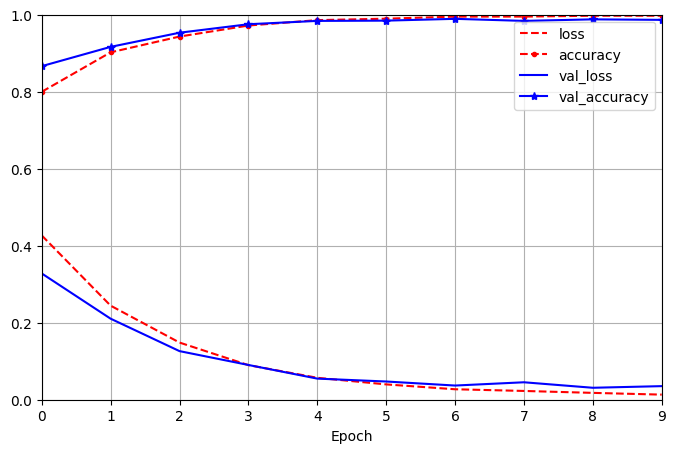

In [250]:
pd.DataFrame(history.history).plot(figsize=(8, 5), xlim=[0, 9], ylim=[0, 1], grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

Se puede ver en el gráfico que, en las épocas finales, *accuracy* y *val_accuracy* están casi encima de la otra lo que indicaría que no hay un overfitting. Viendo el gráfico se puede decir que la precisión converge a uno y la pérdida a cero.

#### Creación de modelo para regresión

In [285]:
def objetivo_reg(trial: optuna.trial.Trial):
    num_capas = trial.suggest_int("num_layers", 1, 4)
    model = Sequential()
    for i in range(num_capas):
        num_conexiones = trial.suggest_int(f"n_units_layer{i}", 4, 200)
        model.add(Dense(num_conexiones, activation="relu"))
    model.add(Dense(1))
    model.compile(optimizer="adam", loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])
    model.fit(fx_train, fy_train, validation_data=(fx_test, fy_test), epochs=10, batch_size=32)
    score = model.evaluate(fx_test, fy_test, verbose=0)
    return score[1]

In [286]:
estudio_reg = optuna.create_study(direction="maximize")
estudio_reg.optimize(objetivo_reg, n_trials=50)

[I 2023-11-20 16:08:00,613] A new study created in memory with name: no-name-e74a747d-1eef-4787-8447-ffd98772137b


Epoch 1/10
234/234 [==============================] - 3s 13ms/step - loss: 0.8564 - rmse: 0.9254 - val_loss: 0.4034 - val_rmse: 0.6351
Epoch 2/10
234/234 [==============================] - 3s 13ms/step - loss: 0.7283 - rmse: 0.8534 - val_loss: 0.3827 - val_rmse: 0.6186
Epoch 3/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6923 - rmse: 0.8320 - val_loss: 0.3847 - val_rmse: 0.6202
Epoch 4/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6752 - rmse: 0.8217 - val_loss: 0.4113 - val_rmse: 0.6414
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6536 - rmse: 0.8085 - val_loss: 0.3770 - val_rmse: 0.6140
Epoch 6/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6432 - rmse: 0.8020 - val_loss: 0.3756 - val_rmse: 0.6129
Epoch 7/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6311 - rmse: 0.7944 - val_loss: 0.3654 - val_rmse: 0.6045
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-20 16:08:30,247] Trial 0 finished with value: 0.6088618040084839 and parameters: {'num_layers': 1, 'n_units_layer0': 107}. Best is trial 0 with value: 0.6088618040084839.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8074 - rmse: 0.8986 - val_loss: 0.3678 - val_rmse: 0.6065
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6879 - rmse: 0.8294 - val_loss: 0.3995 - val_rmse: 0.6320
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6241 - rmse: 0.7900 - val_loss: 0.5483 - val_rmse: 0.7405
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5783 - rmse: 0.7604 - val_loss: 0.4998 - val_rmse: 0.7070
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5338 - rmse: 0.7306 - val_loss: 0.4261 - val_rmse: 0.6528
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4500 - rmse: 0.6708 - val_loss: 0.4147 - val_rmse: 0.6440
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4209 - rmse: 0.6487 - val_loss: 0.3988 - val_rmse: 0.6315
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-20 16:09:20,272] Trial 1 finished with value: 0.6660292148590088 and parameters: {'num_layers': 4, 'n_units_layer0': 198, 'n_units_layer1': 38, 'n_units_layer2': 198, 'n_units_layer3': 114}. Best is trial 1 with value: 0.6660292148590088.


Epoch 1/10
234/234 [==============================] - 3s 12ms/step - loss: 0.9217 - rmse: 0.9600 - val_loss: 0.4519 - val_rmse: 0.6723
Epoch 2/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7676 - rmse: 0.8761 - val_loss: 0.4022 - val_rmse: 0.6342
Epoch 3/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7294 - rmse: 0.8540 - val_loss: 0.4401 - val_rmse: 0.6634
Epoch 4/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7144 - rmse: 0.8452 - val_loss: 0.3869 - val_rmse: 0.6220
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6998 - rmse: 0.8366 - val_loss: 0.3838 - val_rmse: 0.6195
Epoch 6/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6917 - rmse: 0.8317 - val_loss: 0.3838 - val_rmse: 0.6195
Epoch 7/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6832 - rmse: 0.8266 - val_loss: 0.3791 - val_rmse: 0.6157
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-20 16:09:49,671] Trial 2 finished with value: 0.6196179389953613 and parameters: {'num_layers': 1, 'n_units_layer0': 30}. Best is trial 1 with value: 0.6660292148590088.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8103 - rmse: 0.9002 - val_loss: 0.3853 - val_rmse: 0.6207
Epoch 2/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6718 - rmse: 0.8196 - val_loss: 0.3656 - val_rmse: 0.6047
Epoch 3/10
234/234 [==============================] - 5s 19ms/step - loss: 0.6298 - rmse: 0.7936 - val_loss: 0.3741 - val_rmse: 0.6116
Epoch 4/10
234/234 [==============================] - 5s 19ms/step - loss: 0.5729 - rmse: 0.7569 - val_loss: 0.3644 - val_rmse: 0.6037
Epoch 5/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5327 - rmse: 0.7299 - val_loss: 0.4102 - val_rmse: 0.6405
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5093 - rmse: 0.7137 - val_loss: 0.4288 - val_rmse: 0.6548
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4264 - rmse: 0.6530 - val_loss: 0.4513 - val_rmse: 0.6718
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:10:33,700] Trial 3 finished with value: 0.6551572680473328 and parameters: {'num_layers': 3, 'n_units_layer0': 117, 'n_units_layer1': 104, 'n_units_layer2': 108}. Best is trial 1 with value: 0.6660292148590088.


Epoch 1/10
234/234 [==============================] - 3s 12ms/step - loss: 0.8084 - rmse: 0.8991 - val_loss: 0.3831 - val_rmse: 0.6189
Epoch 2/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7016 - rmse: 0.8376 - val_loss: 0.3695 - val_rmse: 0.6078
Epoch 3/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6806 - rmse: 0.8250 - val_loss: 0.3639 - val_rmse: 0.6033
Epoch 4/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6533 - rmse: 0.8083 - val_loss: 0.3686 - val_rmse: 0.6071
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6365 - rmse: 0.7978 - val_loss: 0.3743 - val_rmse: 0.6118
Epoch 6/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6288 - rmse: 0.7930 - val_loss: 0.3644 - val_rmse: 0.6037
Epoch 7/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6072 - rmse: 0.7792 - val_loss: 0.3948 - val_rmse: 0.6283
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-20 16:11:03,079] Trial 4 finished with value: 0.6221604347229004 and parameters: {'num_layers': 1, 'n_units_layer0': 172}. Best is trial 1 with value: 0.6660292148590088.


Epoch 1/10
234/234 [==============================] - 5s 22ms/step - loss: 0.7899 - rmse: 0.8888 - val_loss: 0.3953 - val_rmse: 0.6287
Epoch 2/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6870 - rmse: 0.8289 - val_loss: 0.3476 - val_rmse: 0.5896
Epoch 3/10
234/234 [==============================] - 5s 22ms/step - loss: 0.6201 - rmse: 0.7875 - val_loss: 0.3913 - val_rmse: 0.6255
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5801 - rmse: 0.7616 - val_loss: 0.4665 - val_rmse: 0.6830
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5817 - rmse: 0.7627 - val_loss: 0.3803 - val_rmse: 0.6167
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4793 - rmse: 0.6923 - val_loss: 0.3608 - val_rmse: 0.6007
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4384 - rmse: 0.6621 - val_loss: 0.6769 - val_rmse: 0.8227
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-20 16:11:53,976] Trial 5 finished with value: 0.6569061875343323 and parameters: {'num_layers': 4, 'n_units_layer0': 140, 'n_units_layer1': 82, 'n_units_layer2': 133, 'n_units_layer3': 162}. Best is trial 1 with value: 0.6660292148590088.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8006 - rmse: 0.8948 - val_loss: 0.3832 - val_rmse: 0.6190
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6872 - rmse: 0.8290 - val_loss: 0.3838 - val_rmse: 0.6195
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6404 - rmse: 0.8002 - val_loss: 0.3714 - val_rmse: 0.6094
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5784 - rmse: 0.7606 - val_loss: 0.3676 - val_rmse: 0.6063
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5439 - rmse: 0.7375 - val_loss: 0.4439 - val_rmse: 0.6663
Epoch 6/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5080 - rmse: 0.7128 - val_loss: 0.4394 - val_rmse: 0.6628
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.4642 - rmse: 0.6813 - val_loss: 0.4150 - val_rmse: 0.6442
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:12:31,192] Trial 6 finished with value: 0.6224319338798523 and parameters: {'num_layers': 2, 'n_units_layer0': 167, 'n_units_layer1': 188}. Best is trial 1 with value: 0.6660292148590088.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.8340 - rmse: 0.9133 - val_loss: 0.4284 - val_rmse: 0.6545
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7164 - rmse: 0.8464 - val_loss: 0.3746 - val_rmse: 0.6120
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6647 - rmse: 0.8153 - val_loss: 0.3626 - val_rmse: 0.6022
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6355 - rmse: 0.7972 - val_loss: 0.3554 - val_rmse: 0.5962
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6006 - rmse: 0.7750 - val_loss: 0.3519 - val_rmse: 0.5932
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5817 - rmse: 0.7627 - val_loss: 0.3699 - val_rmse: 0.6082
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5499 - rmse: 0.7415 - val_loss: 0.3894 - val_rmse: 0.6240
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:13:07,400] Trial 7 finished with value: 0.6155700087547302 and parameters: {'num_layers': 2, 'n_units_layer0': 41, 'n_units_layer1': 196}. Best is trial 1 with value: 0.6660292148590088.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8293 - rmse: 0.9106 - val_loss: 0.3679 - val_rmse: 0.6065
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6795 - rmse: 0.8243 - val_loss: 0.3551 - val_rmse: 0.5959
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6380 - rmse: 0.7988 - val_loss: 0.3913 - val_rmse: 0.6255
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5737 - rmse: 0.7575 - val_loss: 0.4175 - val_rmse: 0.6461
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5704 - rmse: 0.7552 - val_loss: 0.4191 - val_rmse: 0.6474
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4761 - rmse: 0.6900 - val_loss: 0.4956 - val_rmse: 0.7040
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4733 - rmse: 0.6880 - val_loss: 0.4032 - val_rmse: 0.6350
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-20 16:13:56,692] Trial 8 finished with value: 0.7026686072349548 and parameters: {'num_layers': 4, 'n_units_layer0': 103, 'n_units_layer1': 89, 'n_units_layer2': 118, 'n_units_layer3': 122}. Best is trial 8 with value: 0.7026686072349548.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8089 - rmse: 0.8994 - val_loss: 0.3944 - val_rmse: 0.6280
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6820 - rmse: 0.8258 - val_loss: 0.3866 - val_rmse: 0.6218
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6343 - rmse: 0.7964 - val_loss: 0.3495 - val_rmse: 0.5912
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5903 - rmse: 0.7683 - val_loss: 0.3910 - val_rmse: 0.6253
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5241 - rmse: 0.7240 - val_loss: 0.3937 - val_rmse: 0.6274
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5172 - rmse: 0.7192 - val_loss: 0.4093 - val_rmse: 0.6398
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4333 - rmse: 0.6583 - val_loss: 0.3818 - val_rmse: 0.6179
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-20 16:14:46,623] Trial 9 finished with value: 0.6369496583938599 and parameters: {'num_layers': 4, 'n_units_layer0': 187, 'n_units_layer1': 24, 'n_units_layer2': 158, 'n_units_layer3': 188}. Best is trial 8 with value: 0.7026686072349548.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8089 - rmse: 0.8994 - val_loss: 0.3633 - val_rmse: 0.6028
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7035 - rmse: 0.8387 - val_loss: 0.3602 - val_rmse: 0.6002
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6473 - rmse: 0.8045 - val_loss: 0.3472 - val_rmse: 0.5892
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6046 - rmse: 0.7775 - val_loss: 0.3602 - val_rmse: 0.6001
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5657 - rmse: 0.7521 - val_loss: 0.3828 - val_rmse: 0.6187
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5392 - rmse: 0.7343 - val_loss: 0.3862 - val_rmse: 0.6215
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4819 - rmse: 0.6942 - val_loss: 0.4796 - val_rmse: 0.6925
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:15:29,579] Trial 10 finished with value: 0.6670539379119873 and parameters: {'num_layers': 3, 'n_units_layer0': 66, 'n_units_layer1': 127, 'n_units_layer2': 23}. Best is trial 8 with value: 0.7026686072349548.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8491 - rmse: 0.9215 - val_loss: 0.4038 - val_rmse: 0.6355
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7106 - rmse: 0.8430 - val_loss: 0.3641 - val_rmse: 0.6034
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6635 - rmse: 0.8145 - val_loss: 0.3945 - val_rmse: 0.6281
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6213 - rmse: 0.7882 - val_loss: 0.3717 - val_rmse: 0.6097
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5858 - rmse: 0.7654 - val_loss: 0.4140 - val_rmse: 0.6434
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5482 - rmse: 0.7404 - val_loss: 0.3540 - val_rmse: 0.5949
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5028 - rmse: 0.7091 - val_loss: 0.4068 - val_rmse: 0.6378
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:16:13,004] Trial 11 finished with value: 0.6782350540161133 and parameters: {'num_layers': 3, 'n_units_layer0': 75, 'n_units_layer1': 119, 'n_units_layer2': 18}. Best is trial 8 with value: 0.7026686072349548.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8016 - rmse: 0.8953 - val_loss: 0.4352 - val_rmse: 0.6597
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6932 - rmse: 0.8326 - val_loss: 0.3795 - val_rmse: 0.6160
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6400 - rmse: 0.8000 - val_loss: 0.3690 - val_rmse: 0.6074
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5864 - rmse: 0.7658 - val_loss: 0.3792 - val_rmse: 0.6158
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5388 - rmse: 0.7340 - val_loss: 0.3853 - val_rmse: 0.6207
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5171 - rmse: 0.7191 - val_loss: 0.3895 - val_rmse: 0.6241
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4504 - rmse: 0.6711 - val_loss: 0.4326 - val_rmse: 0.6577
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:16:56,112] Trial 12 finished with value: 0.7259352803230286 and parameters: {'num_layers': 3, 'n_units_layer0': 71, 'n_units_layer1': 137, 'n_units_layer2': 41}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 5s 22ms/step - loss: 1.0849 - rmse: 1.0416 - val_loss: 0.6354 - val_rmse: 0.7971
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 1.0172 - rmse: 1.0086 - val_loss: 0.5750 - val_rmse: 0.7583
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.9464 - rmse: 0.9728 - val_loss: 0.5221 - val_rmse: 0.7226
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.8896 - rmse: 0.9432 - val_loss: 0.4859 - val_rmse: 0.6970
Epoch 5/10
234/234 [==============================] - 5s 22ms/step - loss: 0.8526 - rmse: 0.9234 - val_loss: 0.4654 - val_rmse: 0.6822
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8264 - rmse: 0.9091 - val_loss: 0.4477 - val_rmse: 0.6691
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.8054 - rmse: 0.8974 - val_loss: 0.4362 - val_rmse: 0.6604
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-20 16:17:46,641] Trial 13 finished with value: 0.6482130289077759 and parameters: {'num_layers': 4, 'n_units_layer0': 6, 'n_units_layer1': 152, 'n_units_layer2': 64, 'n_units_layer3': 4}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8118 - rmse: 0.9010 - val_loss: 0.3950 - val_rmse: 0.6285
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6810 - rmse: 0.8252 - val_loss: 0.3950 - val_rmse: 0.6285
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6303 - rmse: 0.7939 - val_loss: 0.5205 - val_rmse: 0.7215
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5888 - rmse: 0.7673 - val_loss: 0.3652 - val_rmse: 0.6044
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5555 - rmse: 0.7453 - val_loss: 0.3910 - val_rmse: 0.6253
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5185 - rmse: 0.7201 - val_loss: 0.4032 - val_rmse: 0.6350
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4607 - rmse: 0.6787 - val_loss: 0.4694 - val_rmse: 0.6851
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:18:28,962] Trial 14 finished with value: 0.7250180244445801 and parameters: {'num_layers': 3, 'n_units_layer0': 78, 'n_units_layer1': 73, 'n_units_layer2': 72}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8491 - rmse: 0.9215 - val_loss: 0.4051 - val_rmse: 0.6365
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7050 - rmse: 0.8397 - val_loss: 0.3787 - val_rmse: 0.6154
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6631 - rmse: 0.8143 - val_loss: 0.3693 - val_rmse: 0.6077
Epoch 4/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6243 - rmse: 0.7901 - val_loss: 0.3559 - val_rmse: 0.5966
Epoch 5/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5913 - rmse: 0.7690 - val_loss: 0.3611 - val_rmse: 0.6009
Epoch 6/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5711 - rmse: 0.7557 - val_loss: 0.3887 - val_rmse: 0.6234
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5289 - rmse: 0.7272 - val_loss: 0.3938 - val_rmse: 0.6275
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:19:05,645] Trial 15 finished with value: 0.6383808851242065 and parameters: {'num_layers': 2, 'n_units_layer0': 72, 'n_units_layer1': 64}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8475 - rmse: 0.9206 - val_loss: 0.3821 - val_rmse: 0.6181
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7070 - rmse: 0.8408 - val_loss: 0.3698 - val_rmse: 0.6081
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6472 - rmse: 0.8045 - val_loss: 0.4190 - val_rmse: 0.6473
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6001 - rmse: 0.7747 - val_loss: 0.3564 - val_rmse: 0.5970
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5509 - rmse: 0.7422 - val_loss: 0.3752 - val_rmse: 0.6125
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5026 - rmse: 0.7089 - val_loss: 0.3888 - val_rmse: 0.6235
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4630 - rmse: 0.6804 - val_loss: 0.4344 - val_rmse: 0.6591
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:19:48,831] Trial 16 finished with value: 0.6825892329216003 and parameters: {'num_layers': 3, 'n_units_layer0': 51, 'n_units_layer1': 148, 'n_units_layer2': 64}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8217 - rmse: 0.9065 - val_loss: 0.3873 - val_rmse: 0.6223
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6836 - rmse: 0.8268 - val_loss: 0.3557 - val_rmse: 0.5964
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6256 - rmse: 0.7909 - val_loss: 0.3871 - val_rmse: 0.6222
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5920 - rmse: 0.7694 - val_loss: 0.3738 - val_rmse: 0.6114
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5524 - rmse: 0.7433 - val_loss: 0.3774 - val_rmse: 0.6143
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4955 - rmse: 0.7039 - val_loss: 0.3687 - val_rmse: 0.6072
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4682 - rmse: 0.6842 - val_loss: 0.4058 - val_rmse: 0.6370
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:20:31,783] Trial 17 finished with value: 0.6410598754882812 and parameters: {'num_layers': 3, 'n_units_layer0': 132, 'n_units_layer1': 69, 'n_units_layer2': 63}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.8123 - rmse: 0.9013 - val_loss: 0.3847 - val_rmse: 0.6202
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7040 - rmse: 0.8390 - val_loss: 0.4020 - val_rmse: 0.6340
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6586 - rmse: 0.8116 - val_loss: 0.3562 - val_rmse: 0.5968
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6224 - rmse: 0.7889 - val_loss: 0.3687 - val_rmse: 0.6072
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5892 - rmse: 0.7676 - val_loss: 0.3793 - val_rmse: 0.6159
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5618 - rmse: 0.7495 - val_loss: 0.3671 - val_rmse: 0.6059
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5464 - rmse: 0.7392 - val_loss: 0.3806 - val_rmse: 0.6170
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:21:07,868] Trial 18 finished with value: 0.6388350129127502 and parameters: {'num_layers': 2, 'n_units_layer0': 88, 'n_units_layer1': 166}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8854 - rmse: 0.9409 - val_loss: 0.4217 - val_rmse: 0.6494
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7504 - rmse: 0.8663 - val_loss: 0.3814 - val_rmse: 0.6176
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6963 - rmse: 0.8345 - val_loss: 0.3704 - val_rmse: 0.6086
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6591 - rmse: 0.8119 - val_loss: 0.3670 - val_rmse: 0.6058
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6454 - rmse: 0.8034 - val_loss: 0.3621 - val_rmse: 0.6017
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6259 - rmse: 0.7912 - val_loss: 0.4057 - val_rmse: 0.6370
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6032 - rmse: 0.7766 - val_loss: 0.4191 - val_rmse: 0.6474
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:21:51,122] Trial 19 finished with value: 0.5973386764526367 and parameters: {'num_layers': 3, 'n_units_layer0': 17, 'n_units_layer1': 49, 'n_units_layer2': 46}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.9151 - rmse: 0.9566 - val_loss: 0.4317 - val_rmse: 0.6571
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7369 - rmse: 0.8584 - val_loss: 0.3947 - val_rmse: 0.6283
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6793 - rmse: 0.8242 - val_loss: 0.3753 - val_rmse: 0.6126
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6442 - rmse: 0.8026 - val_loss: 0.3660 - val_rmse: 0.6050
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6143 - rmse: 0.7838 - val_loss: 0.3824 - val_rmse: 0.6184
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5859 - rmse: 0.7654 - val_loss: 0.3645 - val_rmse: 0.6037
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5699 - rmse: 0.7549 - val_loss: 0.3856 - val_rmse: 0.6210
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:22:28,111] Trial 20 finished with value: 0.6204544901847839 and parameters: {'num_layers': 2, 'n_units_layer0': 56, 'n_units_layer1': 14}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 5s 22ms/step - loss: 0.8307 - rmse: 0.9114 - val_loss: 0.3939 - val_rmse: 0.6276
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6867 - rmse: 0.8287 - val_loss: 0.3721 - val_rmse: 0.6100
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6221 - rmse: 0.7887 - val_loss: 0.3902 - val_rmse: 0.6247
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5825 - rmse: 0.7632 - val_loss: 0.5664 - val_rmse: 0.7526
Epoch 5/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5591 - rmse: 0.7477 - val_loss: 0.4355 - val_rmse: 0.6599
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4994 - rmse: 0.7067 - val_loss: 0.3748 - val_rmse: 0.6122
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4498 - rmse: 0.6707 - val_loss: 0.3761 - val_rmse: 0.6133
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-20 16:23:19,018] Trial 21 finished with value: 0.6563411355018616 and parameters: {'num_layers': 4, 'n_units_layer0': 90, 'n_units_layer1': 91, 'n_units_layer2': 100, 'n_units_layer3': 68}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 5s 21ms/step - loss: 0.7990 - rmse: 0.8939 - val_loss: 0.3666 - val_rmse: 0.6054
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6855 - rmse: 0.8279 - val_loss: 0.3924 - val_rmse: 0.6264
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6023 - rmse: 0.7761 - val_loss: 0.3586 - val_rmse: 0.5988
Epoch 4/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5669 - rmse: 0.7529 - val_loss: 0.4065 - val_rmse: 0.6376
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5423 - rmse: 0.7364 - val_loss: 0.4228 - val_rmse: 0.6502
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4763 - rmse: 0.6901 - val_loss: 0.3665 - val_rmse: 0.6054
Epoch 7/10
234/234 [==============================] - 5s 21ms/step - loss: 0.4359 - rmse: 0.6602 - val_loss: 0.4552 - val_rmse: 0.6747
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-20 16:24:08,972] Trial 22 finished with value: 0.6566749215126038 and parameters: {'num_layers': 4, 'n_units_layer0': 93, 'n_units_layer1': 111, 'n_units_layer2': 97, 'n_units_layer3': 113}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 4s 19ms/step - loss: 0.8219 - rmse: 0.9066 - val_loss: 0.3674 - val_rmse: 0.6061
Epoch 2/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6829 - rmse: 0.8264 - val_loss: 0.3948 - val_rmse: 0.6283
Epoch 3/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6239 - rmse: 0.7899 - val_loss: 0.3908 - val_rmse: 0.6251
Epoch 4/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5886 - rmse: 0.7672 - val_loss: 0.3738 - val_rmse: 0.6114
Epoch 5/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5483 - rmse: 0.7405 - val_loss: 0.3568 - val_rmse: 0.5973
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4905 - rmse: 0.7004 - val_loss: 0.4466 - val_rmse: 0.6682
Epoch 7/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4479 - rmse: 0.6692 - val_loss: 0.4236 - val_rmse: 0.6509
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:24:53,227] Trial 23 finished with value: 0.7101306915283203 and parameters: {'num_layers': 3, 'n_units_layer0': 121, 'n_units_layer1': 136, 'n_units_layer2': 86}. Best is trial 12 with value: 0.7259352803230286.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7797 - rmse: 0.8830 - val_loss: 0.3847 - val_rmse: 0.6202
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6862 - rmse: 0.8284 - val_loss: 0.3877 - val_rmse: 0.6227
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6463 - rmse: 0.8039 - val_loss: 0.3733 - val_rmse: 0.6110
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5892 - rmse: 0.7676 - val_loss: 0.4289 - val_rmse: 0.6549
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5168 - rmse: 0.7189 - val_loss: 0.4242 - val_rmse: 0.6513
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4909 - rmse: 0.7007 - val_loss: 0.3656 - val_rmse: 0.6047
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4586 - rmse: 0.6772 - val_loss: 0.4938 - val_rmse: 0.7027
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:25:36,693] Trial 24 finished with value: 0.8054697513580322 and parameters: {'num_layers': 3, 'n_units_layer0': 150, 'n_units_layer1': 133, 'n_units_layer2': 79}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8063 - rmse: 0.8979 - val_loss: 0.3969 - val_rmse: 0.6300
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6939 - rmse: 0.8330 - val_loss: 0.4308 - val_rmse: 0.6564
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6214 - rmse: 0.7883 - val_loss: 0.3553 - val_rmse: 0.5960
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5912 - rmse: 0.7689 - val_loss: 0.3427 - val_rmse: 0.5854
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5427 - rmse: 0.7367 - val_loss: 0.3784 - val_rmse: 0.6152
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4890 - rmse: 0.6993 - val_loss: 0.4327 - val_rmse: 0.6578
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4520 - rmse: 0.6723 - val_loss: 0.4149 - val_rmse: 0.6441
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:26:19,802] Trial 25 finished with value: 0.6138334274291992 and parameters: {'num_layers': 3, 'n_units_layer0': 156, 'n_units_layer1': 177, 'n_units_layer2': 40}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7930 - rmse: 0.8905 - val_loss: 0.4104 - val_rmse: 0.6406
Epoch 2/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6663 - rmse: 0.8162 - val_loss: 0.3719 - val_rmse: 0.6099
Epoch 3/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6303 - rmse: 0.7939 - val_loss: 0.3630 - val_rmse: 0.6025
Epoch 4/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5678 - rmse: 0.7535 - val_loss: 0.3795 - val_rmse: 0.6160
Epoch 5/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5374 - rmse: 0.7331 - val_loss: 0.4111 - val_rmse: 0.6412
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4965 - rmse: 0.7046 - val_loss: 0.4571 - val_rmse: 0.6761
Epoch 7/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4431 - rmse: 0.6656 - val_loss: 0.4949 - val_rmse: 0.7035
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:27:04,684] Trial 26 finished with value: 0.6338812112808228 and parameters: {'num_layers': 3, 'n_units_layer0': 140, 'n_units_layer1': 139, 'n_units_layer2': 78}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8000 - rmse: 0.8945 - val_loss: 0.3763 - val_rmse: 0.6134
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6899 - rmse: 0.8306 - val_loss: 0.3778 - val_rmse: 0.6146
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6453 - rmse: 0.8033 - val_loss: 0.3771 - val_rmse: 0.6141
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5976 - rmse: 0.7730 - val_loss: 0.3891 - val_rmse: 0.6238
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5722 - rmse: 0.7564 - val_loss: 0.3589 - val_rmse: 0.5991
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5403 - rmse: 0.7350 - val_loss: 0.4500 - val_rmse: 0.6708
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5086 - rmse: 0.7132 - val_loss: 0.3976 - val_rmse: 0.6305
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:27:41,309] Trial 27 finished with value: 0.7121695280075073 and parameters: {'num_layers': 2, 'n_units_layer0': 80, 'n_units_layer1': 161}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8293 - rmse: 0.9107 - val_loss: 0.3900 - val_rmse: 0.6245
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6953 - rmse: 0.8338 - val_loss: 0.3678 - val_rmse: 0.6064
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6580 - rmse: 0.8112 - val_loss: 0.3679 - val_rmse: 0.6065
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6246 - rmse: 0.7903 - val_loss: 0.4544 - val_rmse: 0.6741
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5756 - rmse: 0.7587 - val_loss: 0.3890 - val_rmse: 0.6237
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5254 - rmse: 0.7249 - val_loss: 0.3570 - val_rmse: 0.5975
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5009 - rmse: 0.7077 - val_loss: 0.3949 - val_rmse: 0.6284
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:28:24,152] Trial 28 finished with value: 0.6600269675254822 and parameters: {'num_layers': 3, 'n_units_layer0': 57, 'n_units_layer1': 125, 'n_units_layer2': 38}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8159 - rmse: 0.9032 - val_loss: 0.3770 - val_rmse: 0.6140
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6998 - rmse: 0.8366 - val_loss: 0.3578 - val_rmse: 0.5982
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6464 - rmse: 0.8040 - val_loss: 0.4435 - val_rmse: 0.6660
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6135 - rmse: 0.7832 - val_loss: 0.3520 - val_rmse: 0.5933
Epoch 5/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5642 - rmse: 0.7511 - val_loss: 0.3805 - val_rmse: 0.6169
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5320 - rmse: 0.7294 - val_loss: 0.3638 - val_rmse: 0.6032
Epoch 7/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4961 - rmse: 0.7043 - val_loss: 0.4154 - val_rmse: 0.6445
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:29:07,606] Trial 29 finished with value: 0.6745499968528748 and parameters: {'num_layers': 3, 'n_units_layer0': 113, 'n_units_layer1': 102, 'n_units_layer2': 5}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8854 - rmse: 0.9410 - val_loss: 0.4290 - val_rmse: 0.6550
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7414 - rmse: 0.8611 - val_loss: 0.3946 - val_rmse: 0.6281
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6863 - rmse: 0.8284 - val_loss: 0.3741 - val_rmse: 0.6117
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6575 - rmse: 0.8108 - val_loss: 0.3768 - val_rmse: 0.6138
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6374 - rmse: 0.7984 - val_loss: 0.3621 - val_rmse: 0.6018
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6168 - rmse: 0.7854 - val_loss: 0.3494 - val_rmse: 0.5911
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5963 - rmse: 0.7722 - val_loss: 0.3528 - val_rmse: 0.5940
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:29:44,632] Trial 30 finished with value: 0.598085343837738 and parameters: {'num_layers': 2, 'n_units_layer0': 40, 'n_units_layer1': 68}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8065 - rmse: 0.8981 - val_loss: 0.3816 - val_rmse: 0.6178
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6900 - rmse: 0.8307 - val_loss: 0.3584 - val_rmse: 0.5987
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6416 - rmse: 0.8010 - val_loss: 0.4235 - val_rmse: 0.6508
Epoch 4/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6039 - rmse: 0.7771 - val_loss: 0.3664 - val_rmse: 0.6053
Epoch 5/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5682 - rmse: 0.7538 - val_loss: 0.3864 - val_rmse: 0.6216
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5408 - rmse: 0.7354 - val_loss: 0.3751 - val_rmse: 0.6125
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5062 - rmse: 0.7115 - val_loss: 0.4072 - val_rmse: 0.6381
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:30:21,669] Trial 31 finished with value: 0.6293864846229553 and parameters: {'num_layers': 2, 'n_units_layer0': 81, 'n_units_layer1': 158}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 3s 12ms/step - loss: 0.8497 - rmse: 0.9218 - val_loss: 0.4002 - val_rmse: 0.6326
Epoch 2/10
234/234 [==============================] - 3s 13ms/step - loss: 0.7292 - rmse: 0.8539 - val_loss: 0.3953 - val_rmse: 0.6287
Epoch 3/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6955 - rmse: 0.8340 - val_loss: 0.3732 - val_rmse: 0.6109
Epoch 4/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6774 - rmse: 0.8230 - val_loss: 0.3709 - val_rmse: 0.6090
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6618 - rmse: 0.8135 - val_loss: 0.3735 - val_rmse: 0.6111
Epoch 6/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6423 - rmse: 0.8015 - val_loss: 0.3646 - val_rmse: 0.6038
Epoch 7/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6335 - rmse: 0.7959 - val_loss: 0.3641 - val_rmse: 0.6034
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-20 16:30:51,875] Trial 32 finished with value: 0.6015070080757141 and parameters: {'num_layers': 1, 'n_units_layer0': 100}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8257 - rmse: 0.9087 - val_loss: 0.3893 - val_rmse: 0.6239
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6991 - rmse: 0.8361 - val_loss: 0.3445 - val_rmse: 0.5870
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6469 - rmse: 0.8043 - val_loss: 0.3697 - val_rmse: 0.6080
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6162 - rmse: 0.7850 - val_loss: 0.3680 - val_rmse: 0.6067
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5670 - rmse: 0.7530 - val_loss: 0.4297 - val_rmse: 0.6555
Epoch 6/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5414 - rmse: 0.7358 - val_loss: 0.3770 - val_rmse: 0.6140
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5027 - rmse: 0.7090 - val_loss: 0.4021 - val_rmse: 0.6341
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:31:28,835] Trial 33 finished with value: 0.657821774482727 and parameters: {'num_layers': 2, 'n_units_layer0': 64, 'n_units_layer1': 169}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7934 - rmse: 0.8907 - val_loss: 0.3744 - val_rmse: 0.6119
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6712 - rmse: 0.8193 - val_loss: 0.4039 - val_rmse: 0.6355
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6285 - rmse: 0.7928 - val_loss: 0.3451 - val_rmse: 0.5875
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5748 - rmse: 0.7582 - val_loss: 0.3749 - val_rmse: 0.6123
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5486 - rmse: 0.7407 - val_loss: 0.3978 - val_rmse: 0.6308
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5023 - rmse: 0.7087 - val_loss: 0.3843 - val_rmse: 0.6199
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4377 - rmse: 0.6616 - val_loss: 0.4193 - val_rmse: 0.6475
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:32:11,635] Trial 34 finished with value: 0.6471904516220093 and parameters: {'num_layers': 3, 'n_units_layer0': 126, 'n_units_layer1': 135, 'n_units_layer2': 73}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 3s 12ms/step - loss: 0.8831 - rmse: 0.9397 - val_loss: 0.4102 - val_rmse: 0.6404
Epoch 2/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7294 - rmse: 0.8540 - val_loss: 0.4548 - val_rmse: 0.6744
Epoch 3/10
234/234 [==============================] - 3s 12ms/step - loss: 0.7028 - rmse: 0.8384 - val_loss: 0.3860 - val_rmse: 0.6213
Epoch 4/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6853 - rmse: 0.8278 - val_loss: 0.3806 - val_rmse: 0.6169
Epoch 5/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6644 - rmse: 0.8151 - val_loss: 0.3681 - val_rmse: 0.6067
Epoch 6/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6427 - rmse: 0.8017 - val_loss: 0.3889 - val_rmse: 0.6236
Epoch 7/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6415 - rmse: 0.8009 - val_loss: 0.3704 - val_rmse: 0.6086
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-20 16:32:41,225] Trial 35 finished with value: 0.6069353222846985 and parameters: {'num_layers': 1, 'n_units_layer0': 81}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8219 - rmse: 0.9066 - val_loss: 0.3839 - val_rmse: 0.6196
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6837 - rmse: 0.8269 - val_loss: 0.4235 - val_rmse: 0.6507
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6055 - rmse: 0.7782 - val_loss: 0.4312 - val_rmse: 0.6567
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5821 - rmse: 0.7630 - val_loss: 0.4400 - val_rmse: 0.6634
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5573 - rmse: 0.7465 - val_loss: 0.4141 - val_rmse: 0.6435
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4876 - rmse: 0.6983 - val_loss: 0.4180 - val_rmse: 0.6465
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4538 - rmse: 0.6737 - val_loss: 0.5142 - val_rmse: 0.7171
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:33:24,106] Trial 36 finished with value: 0.6510714292526245 and parameters: {'num_layers': 3, 'n_units_layer0': 106, 'n_units_layer1': 181, 'n_units_layer2': 48}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.8276 - rmse: 0.9097 - val_loss: 0.3911 - val_rmse: 0.6254
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7085 - rmse: 0.8417 - val_loss: 0.3766 - val_rmse: 0.6137
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6790 - rmse: 0.8240 - val_loss: 0.3570 - val_rmse: 0.5975
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6364 - rmse: 0.7978 - val_loss: 0.3576 - val_rmse: 0.5980
Epoch 5/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6087 - rmse: 0.7802 - val_loss: 0.3493 - val_rmse: 0.5910
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5847 - rmse: 0.7647 - val_loss: 0.3535 - val_rmse: 0.5946
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5613 - rmse: 0.7492 - val_loss: 0.3665 - val_rmse: 0.6054
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:34:00,924] Trial 37 finished with value: 0.614032506942749 and parameters: {'num_layers': 2, 'n_units_layer0': 41, 'n_units_layer1': 144}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7956 - rmse: 0.8920 - val_loss: 0.3872 - val_rmse: 0.6223
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6696 - rmse: 0.8183 - val_loss: 0.3585 - val_rmse: 0.5987
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6152 - rmse: 0.7844 - val_loss: 0.4271 - val_rmse: 0.6535
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5852 - rmse: 0.7650 - val_loss: 0.3948 - val_rmse: 0.6284
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5282 - rmse: 0.7268 - val_loss: 0.4019 - val_rmse: 0.6340
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4705 - rmse: 0.6859 - val_loss: 0.5064 - val_rmse: 0.7116
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4190 - rmse: 0.6473 - val_loss: 0.4215 - val_rmse: 0.6492
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:34:44,520] Trial 38 finished with value: 0.6537224650382996 and parameters: {'num_layers': 3, 'n_units_layer0': 163, 'n_units_layer1': 108, 'n_units_layer2': 132}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8258 - rmse: 0.9087 - val_loss: 0.3776 - val_rmse: 0.6145
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6947 - rmse: 0.8335 - val_loss: 0.3749 - val_rmse: 0.6123
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6434 - rmse: 0.8021 - val_loss: 0.3716 - val_rmse: 0.6096
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6062 - rmse: 0.7786 - val_loss: 0.3626 - val_rmse: 0.6022
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5704 - rmse: 0.7552 - val_loss: 0.3716 - val_rmse: 0.6096
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5375 - rmse: 0.7331 - val_loss: 0.3656 - val_rmse: 0.6047
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.4955 - rmse: 0.7039 - val_loss: 0.3986 - val_rmse: 0.6313
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:35:21,074] Trial 39 finished with value: 0.670793354511261 and parameters: {'num_layers': 2, 'n_units_layer0': 197, 'n_units_layer1': 46}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 3s 13ms/step - loss: 0.9609 - rmse: 0.9803 - val_loss: 0.4555 - val_rmse: 0.6749
Epoch 2/10
234/234 [==============================] - 3s 13ms/step - loss: 0.7707 - rmse: 0.8779 - val_loss: 0.4079 - val_rmse: 0.6387
Epoch 3/10
234/234 [==============================] - 3s 13ms/step - loss: 0.7229 - rmse: 0.8502 - val_loss: 0.3886 - val_rmse: 0.6234
Epoch 4/10
234/234 [==============================] - 3s 13ms/step - loss: 0.7010 - rmse: 0.8373 - val_loss: 0.3919 - val_rmse: 0.6260
Epoch 5/10
234/234 [==============================] - 3s 12ms/step - loss: 0.6857 - rmse: 0.8281 - val_loss: 0.3817 - val_rmse: 0.6178
Epoch 6/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6749 - rmse: 0.8215 - val_loss: 0.3793 - val_rmse: 0.6159
Epoch 7/10
234/234 [==============================] - 3s 13ms/step - loss: 0.6651 - rmse: 0.8155 - val_loss: 0.3800 - val_rmse: 0.6164
Epoch 8/10
234/234 [==============================] - 3

[I 2023-11-20 16:35:51,072] Trial 40 finished with value: 0.6131202578544617 and parameters: {'num_layers': 1, 'n_units_layer0': 29}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 19ms/step - loss: 0.8018 - rmse: 0.8955 - val_loss: 0.3893 - val_rmse: 0.6240
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6529 - rmse: 0.8080 - val_loss: 0.4024 - val_rmse: 0.6344
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6097 - rmse: 0.7808 - val_loss: 0.4634 - val_rmse: 0.6807
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5785 - rmse: 0.7606 - val_loss: 0.4671 - val_rmse: 0.6835
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5300 - rmse: 0.7280 - val_loss: 0.3838 - val_rmse: 0.6195
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4757 - rmse: 0.6897 - val_loss: 0.4846 - val_rmse: 0.6961
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4462 - rmse: 0.6680 - val_loss: 0.3987 - val_rmse: 0.6314
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:36:34,796] Trial 41 finished with value: 0.7621404528617859 and parameters: {'num_layers': 3, 'n_units_layer0': 147, 'n_units_layer1': 159, 'n_units_layer2': 87}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7732 - rmse: 0.8793 - val_loss: 0.3912 - val_rmse: 0.6255
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6612 - rmse: 0.8132 - val_loss: 0.4056 - val_rmse: 0.6369
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5996 - rmse: 0.7743 - val_loss: 0.3831 - val_rmse: 0.6189
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5523 - rmse: 0.7432 - val_loss: 0.4132 - val_rmse: 0.6428
Epoch 5/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4980 - rmse: 0.7057 - val_loss: 0.3969 - val_rmse: 0.6300
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4383 - rmse: 0.6620 - val_loss: 0.4086 - val_rmse: 0.6392
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4191 - rmse: 0.6474 - val_loss: 0.6632 - val_rmse: 0.8144
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:37:18,263] Trial 42 finished with value: 0.687154233455658 and parameters: {'num_layers': 3, 'n_units_layer0': 142, 'n_units_layer1': 160, 'n_units_layer2': 87}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7989 - rmse: 0.8938 - val_loss: 0.3632 - val_rmse: 0.6027
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6842 - rmse: 0.8271 - val_loss: 0.3851 - val_rmse: 0.6206
Epoch 3/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6316 - rmse: 0.7947 - val_loss: 0.3706 - val_rmse: 0.6088
Epoch 4/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5680 - rmse: 0.7536 - val_loss: 0.4250 - val_rmse: 0.6520
Epoch 5/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5291 - rmse: 0.7274 - val_loss: 0.4770 - val_rmse: 0.6906
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4949 - rmse: 0.7035 - val_loss: 0.4459 - val_rmse: 0.6677
Epoch 7/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4145 - rmse: 0.6438 - val_loss: 0.4387 - val_rmse: 0.6623
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:38:02,775] Trial 43 finished with value: 0.6920362710952759 and parameters: {'num_layers': 3, 'n_units_layer0': 152, 'n_units_layer1': 193, 'n_units_layer2': 56}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 5s 22ms/step - loss: 0.8025 - rmse: 0.8958 - val_loss: 0.3597 - val_rmse: 0.5998
Epoch 2/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6840 - rmse: 0.8271 - val_loss: 0.3500 - val_rmse: 0.5916
Epoch 3/10
234/234 [==============================] - 5s 21ms/step - loss: 0.6228 - rmse: 0.7892 - val_loss: 0.3564 - val_rmse: 0.5970
Epoch 4/10
234/234 [==============================] - 5s 22ms/step - loss: 0.5857 - rmse: 0.7653 - val_loss: 0.3926 - val_rmse: 0.6266
Epoch 5/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5331 - rmse: 0.7301 - val_loss: 0.4661 - val_rmse: 0.6827
Epoch 6/10
234/234 [==============================] - 5s 21ms/step - loss: 0.5011 - rmse: 0.7079 - val_loss: 0.4436 - val_rmse: 0.6660
Epoch 7/10
234/234 [==============================] - 5s 22ms/step - loss: 0.4439 - rmse: 0.6662 - val_loss: 0.3981 - val_rmse: 0.6310
Epoch 8/10
234/234 [==============================] - 5

[I 2023-11-20 16:38:53,529] Trial 44 finished with value: 0.6559954881668091 and parameters: {'num_layers': 4, 'n_units_layer0': 173, 'n_units_layer1': 174, 'n_units_layer2': 82, 'n_units_layer3': 18}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 19ms/step - loss: 0.8223 - rmse: 0.9068 - val_loss: 0.3783 - val_rmse: 0.6151
Epoch 2/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6812 - rmse: 0.8253 - val_loss: 0.3637 - val_rmse: 0.6031
Epoch 3/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6194 - rmse: 0.7870 - val_loss: 0.3900 - val_rmse: 0.6245
Epoch 4/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5891 - rmse: 0.7675 - val_loss: 0.3755 - val_rmse: 0.6128
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5053 - rmse: 0.7109 - val_loss: 0.4447 - val_rmse: 0.6669
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4939 - rmse: 0.7028 - val_loss: 0.4064 - val_rmse: 0.6375
Epoch 7/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4246 - rmse: 0.6516 - val_loss: 0.6471 - val_rmse: 0.8044
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:39:38,056] Trial 45 finished with value: 0.659207284450531 and parameters: {'num_layers': 3, 'n_units_layer0': 114, 'n_units_layer1': 157, 'n_units_layer2': 27}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.8022 - rmse: 0.8956 - val_loss: 0.3883 - val_rmse: 0.6231
Epoch 2/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6948 - rmse: 0.8336 - val_loss: 0.3890 - val_rmse: 0.6237
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.6333 - rmse: 0.7958 - val_loss: 0.4024 - val_rmse: 0.6343
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6121 - rmse: 0.7824 - val_loss: 0.4260 - val_rmse: 0.6527
Epoch 5/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5768 - rmse: 0.7594 - val_loss: 0.3689 - val_rmse: 0.6074
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5439 - rmse: 0.7375 - val_loss: 0.4229 - val_rmse: 0.6503
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5262 - rmse: 0.7254 - val_loss: 0.3603 - val_rmse: 0.6002
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:40:14,786] Trial 46 finished with value: 0.6314361095428467 and parameters: {'num_layers': 2, 'n_units_layer0': 97, 'n_units_layer1': 119}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8309 - rmse: 0.9115 - val_loss: 0.3712 - val_rmse: 0.6092
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.7009 - rmse: 0.8372 - val_loss: 0.3641 - val_rmse: 0.6034
Epoch 3/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6462 - rmse: 0.8039 - val_loss: 0.3924 - val_rmse: 0.6264
Epoch 4/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6051 - rmse: 0.7779 - val_loss: 0.4048 - val_rmse: 0.6363
Epoch 5/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5571 - rmse: 0.7464 - val_loss: 0.3924 - val_rmse: 0.6264
Epoch 6/10
234/234 [==============================] - 4s 18ms/step - loss: 0.5323 - rmse: 0.7296 - val_loss: 0.4452 - val_rmse: 0.6672
Epoch 7/10
234/234 [==============================] - 4s 18ms/step - loss: 0.4981 - rmse: 0.7058 - val_loss: 0.3986 - val_rmse: 0.6313
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:40:58,171] Trial 47 finished with value: 0.6717772483825684 and parameters: {'num_layers': 3, 'n_units_layer0': 68, 'n_units_layer1': 99, 'n_units_layer2': 69}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 18ms/step - loss: 0.8146 - rmse: 0.9025 - val_loss: 0.3784 - val_rmse: 0.6151
Epoch 2/10
234/234 [==============================] - 4s 18ms/step - loss: 0.6838 - rmse: 0.8269 - val_loss: 0.3727 - val_rmse: 0.6105
Epoch 3/10
234/234 [==============================] - 4s 19ms/step - loss: 0.6238 - rmse: 0.7898 - val_loss: 0.3775 - val_rmse: 0.6144
Epoch 4/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5737 - rmse: 0.7574 - val_loss: 0.3626 - val_rmse: 0.6022
Epoch 5/10
234/234 [==============================] - 4s 19ms/step - loss: 0.5467 - rmse: 0.7394 - val_loss: 0.3922 - val_rmse: 0.6263
Epoch 6/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4784 - rmse: 0.6917 - val_loss: 0.5158 - val_rmse: 0.7182
Epoch 7/10
234/234 [==============================] - 4s 19ms/step - loss: 0.4697 - rmse: 0.6854 - val_loss: 0.3997 - val_rmse: 0.6322
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:41:42,178] Trial 48 finished with value: 0.687152087688446 and parameters: {'num_layers': 3, 'n_units_layer0': 75, 'n_units_layer1': 128, 'n_units_layer2': 117}. Best is trial 24 with value: 0.8054697513580322.


Epoch 1/10
234/234 [==============================] - 4s 15ms/step - loss: 0.8291 - rmse: 0.9106 - val_loss: 0.3794 - val_rmse: 0.6159
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6933 - rmse: 0.8327 - val_loss: 0.3764 - val_rmse: 0.6135
Epoch 3/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6578 - rmse: 0.8111 - val_loss: 0.3889 - val_rmse: 0.6236
Epoch 4/10
234/234 [==============================] - 4s 15ms/step - loss: 0.6047 - rmse: 0.7776 - val_loss: 0.3969 - val_rmse: 0.6300
Epoch 5/10
234/234 [==============================] - 4s 16ms/step - loss: 0.5815 - rmse: 0.7626 - val_loss: 0.4077 - val_rmse: 0.6385
Epoch 6/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5579 - rmse: 0.7469 - val_loss: 0.4247 - val_rmse: 0.6517
Epoch 7/10
234/234 [==============================] - 4s 15ms/step - loss: 0.5065 - rmse: 0.7117 - val_loss: 0.3966 - val_rmse: 0.6298
Epoch 8/10
234/234 [==============================] - 4

[I 2023-11-20 16:42:18,840] Trial 49 finished with value: 0.6326780915260315 and parameters: {'num_layers': 2, 'n_units_layer0': 84, 'n_units_layer1': 150}. Best is trial 24 with value: 0.8054697513580322.


In [287]:
estudio_reg.best_params

{'num_layers': 3,
 'n_units_layer0': 150,
 'n_units_layer1': 133,
 'n_units_layer2': 79}

In [288]:
estudio_reg.best_value

0.8054697513580322

Luego de haber realizado distintas pruebas utilizando optula se encontró que los mejores parámetros son:
* Número de capas: 3
* Neuronas en capa 1: 150
* Neuronas en capa 2: 133
* Neuronas en capa 3: 79

#### Creación del modelo

In [307]:
modelo_reg = Sequential()
modelo_reg.add(Input(shape=[fx_train.shape[1], ]))
modelo_reg.add(Dense(150, activation="relu"))
modelo_reg.add(Dense(133, activation="relu"))
modelo_reg.add(Dense(79, activation="relu"))
modelo_reg.add(Dense(1))
model.compile(optimizer="adam", loss="mean_squared_error", metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])
history_reg = model.fit(fx_train, fy_train, validation_data=(fx_test, fy_test), epochs=10, batch_size=32)

Epoch 1/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7830 - rmse: 0.8849 - val_loss: 0.5006 - val_rmse: 0.7075
Epoch 2/10
234/234 [==============================] - 4s 15ms/step - loss: 0.7841 - rmse: 0.8855 - val_loss: 0.4966 - val_rmse: 0.7047
Epoch 3/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7820 - rmse: 0.8843 - val_loss: 0.4995 - val_rmse: 0.7067
Epoch 4/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7858 - rmse: 0.8864 - val_loss: 0.4990 - val_rmse: 0.7064
Epoch 5/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7839 - rmse: 0.8854 - val_loss: 0.4957 - val_rmse: 0.7041
Epoch 6/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7819 - rmse: 0.8842 - val_loss: 0.4997 - val_rmse: 0.7069
Epoch 7/10
234/234 [==============================] - 4s 16ms/step - loss: 0.7807 - rmse: 0.8836 - val_loss: 0.5052 - val_rmse: 0.7108
Epoch 8/10
234/234 [==============================] - 4

In [308]:
model.evaluate(fx_test, fy_test)

101/101 [==============================] - 0s 5ms/step - loss: 0.4974 - rmse: 0.7053


[0.4974200129508972, 0.7052801251411438]

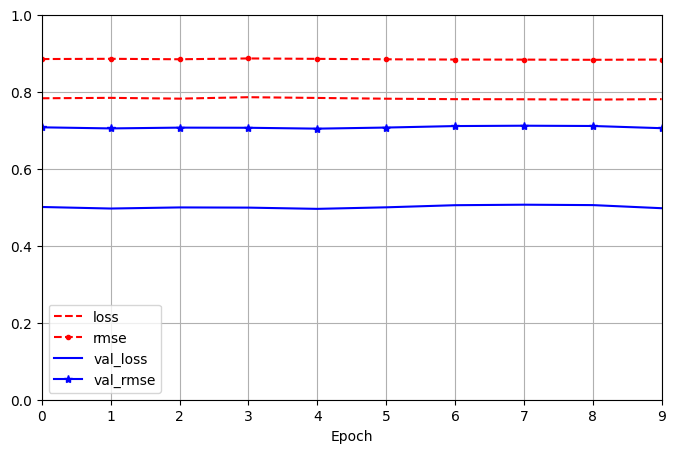

In [310]:
pd.DataFrame(history_reg.history).plot(figsize=(8, 5), xlim=[0, 9], ylim=[0, 1], grid=True, xlabel="Epoch", style=["r--", "r--.", "b-", "b-*"])
plt.show()

Analizando el gráfico, podemos ver que la métrica RMSE de training está muy por encima del RMSE de testing y lo mismo sucede con la pérdida, por lo tanto contamos con overfitting. Debemos aplicar regularización para ver si podemos mejorar nuestro modelo